In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.datasets import make_blobs
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.preprocessing import label_binarize
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, roc_curve, roc_auc_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

1. Сгенерировать двумерные датасеты df_a (размерности 4х4, 16х16, 256х256), в
которых в каждой строке х начиная с колонки y(=х) значения следующих (a/2)
ячеек равны «1» (если достигнут конец строки датасета, сверх размера
датасета не заполняем, на новую строку не переходим), а оставшиеся ячейки
датасета равны «0». Выполнить визуализацию датасетов в пространстве X-Y.

In [3]:
def generate_dataset(size):
    dataset = np.zeros((size, size), dtype=int)
    for x in range(size):
        y_start = x
        y_end = min(y_start + (size // 2), size)
        dataset[x, y_start:y_end] = 1
    return pd.DataFrame(dataset)

In [4]:
datasets = {
    '4': generate_dataset(4),
    '16': generate_dataset(16),
    '256': generate_dataset(256),
}
datasets['4']

,0,1,2,3
0,1,1,0,0
1,0,1,1,0
2,0,0,1,1
3,0,0,0,1


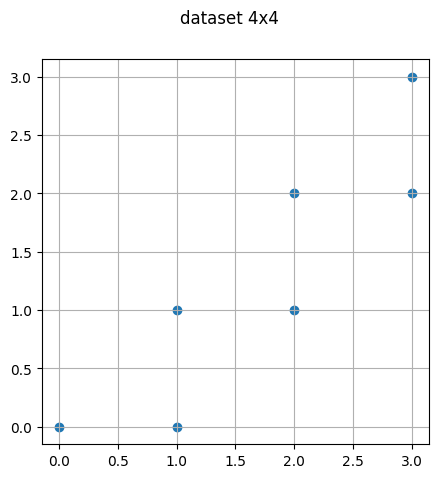

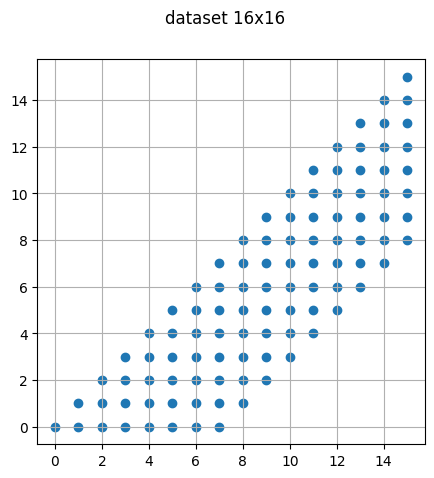

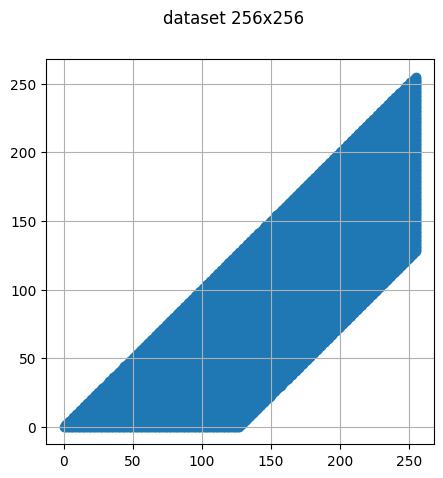

In [5]:
for name, dataset in datasets.items():
    plt.figure(figsize=(5, 5))
    plt.suptitle(f'dataset {name}x{name}')

    x, y = np.where(dataset.values == 1)
    plt.scatter(y, x)
    plt.grid()

    plt.show()

2. Используя метод главных компонент (основанный на корреляциях), для
каждого датасета df_a отдельно визуализировать:
- Scree plot;
- Отображения отдельных объектов-строк в двумерных пространствах первых

компонент от 1 до а (а на выбор от 4 до 8) – без отображения старых векторов-
переменных;

- Отображения отдельных объектов-строк в двумерных пространствах первых

компонент от 1 до а (а на выбор от 4 до 8) – с отображением старых векторов-
переменных.

- Отображения отдельных объектов-строк в двумерных пространствах первых
компонент от c до c+а (а на выбор от 4 до 8, c – любая со 129) – без отображения
старых векторов-переменных;
- Отображения отдельных объектов-строк в двумерных пространствах первых
компонент от c до c+а (а на выбор от 4 до 8, c – любая со 129)– с отображением
старых векторов-переменных.

In [6]:
def task_2(dataset, a=6, c=200):
    dataset_1 = dataset.copy()
    dataset_1['class'] = dataset_1.index
    dataset_scaler = StandardScaler()
    dataset_scaler.fit(dataset)
    dataset_scaled = dataset_scaler.transform(dataset)

    pca = PCA()
    pca.fit(dataset_scaled)

    # A) Scree plot
    explaned_variance_ratio = pca.explained_variance_ratio_
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f'A) scree plot, dataset {name}x{name}')
    plt.plot(np.arange(1, len(explaned_variance_ratio) + 1), explaned_variance_ratio)
    plt.scatter(np.arange(1, len(explaned_variance_ratio) + 1), explaned_variance_ratio, color='red', s=10, alpha=0.6)
    plt.xlabel('Количество компонентов')
    plt.ylabel('Коэффициент дисперсии')

    eigenvalues = pca.explained_variance_
    print(eigenvalues/explaned_variance_ratio)
    print(explaned_variance_ratio/eigenvalues)
    print(eigenvalues)
    print(explaned_variance_ratio)
    components_kaiser = sum(eigenvalues > 1)

    print(f"Количество компонентов по методу Кайзера: {components_kaiser}")

    plt.subplot(1, 2, 2)
    plt.title(f'A) scree plot, dataset - {name}')
    plt.plot(np.arange(1, len(eigenvalues) + 1), eigenvalues)
    plt.scatter(np.arange(1, len(eigenvalues) + 1), eigenvalues, color='red', s=10, alpha=0.6)
    plt.axhline(y=1, color='green', linestyle='-', label='Кайзер')
    plt.xlabel('Число компонент')
    plt.ylabel('Собственное значение')
    plt.show()

    # B)
    plt.figure(figsize=(a*3+2, a*3))
    plt.suptitle(f'B) dataset {name}x{name}')

    if len(explaned_variance_ratio) < a:
           print(f'a > количество переменных  =>  a = кол-во переменных')
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    for i in range(a):
        for j in range(a):
            plt.subplot(a, a, i*a+j+1)
            scatter = plt.scatter(pca_result[:, i], pca_result[:, j], c=dataset_1['class'],  cmap='viridis', s=10)
            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.colorbar(scatter, ax=plt.gcf().axes, orientation='vertical', fraction=0.02, pad=0.02, label='Class')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

    # C)
    plt.figure(figsize=(a*3+2, a*3))
    plt.suptitle(f'C) dataset {name}x{name}')

    if len(explaned_variance_ratio) < c+a:
           print(f'a > количество переменных  =>  a = кол-во переменных')
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    lim_value = 0
    for i in range(a):
        for j in range(a):
            plt.subplot(a, a, i*a+j+1)
            scatter = plt.scatter(pca_result[:, i], pca_result[:, j], c=dataset_1['class'],  cmap='viridis', s=10)
            for k in range(dataset.shape[1]):
                x, y = pca.components_[i, k], pca.components_[j, k]
                length = np.linalg.norm([x, y])
                lim_value = 0
                vec = [x, y]
                norm = np.sqrt(vec[0]**2 + vec[1]**2)
                if norm != 0:
                    norm_vec = vec / norm
                x_norm, y_norm = norm_vec[0], norm_vec[1]
                plt.quiver(0, 0, x_norm, y_norm, angles='xy', scale_units='xy', scale=1, linewidth=0.1, alpha=0.5, color='red')
                print(x_norm, y_norm)
            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            lim_value = max(lim_value, np.max(np.abs(pca_result)))
            plt.xlim([-lim_value-1, lim_value+1])
            plt.ylim([-lim_value-1, lim_value+1])
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.colorbar(scatter, ax=plt.gcf().axes, orientation='vertical', fraction=0.02, pad=0.02, label='Class')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

    # D)
    plt.figure(figsize=(a*3+2, a*3))
    plt.suptitle(f'D) dataset {name}x{name}')

    if len(explaned_variance_ratio) < c+a:
           print(f'c+a > количество переменных  =>  break')
           return
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=c+a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    for i in range(c, c+a):
        for j in range(c, c+a):
            plt.subplot(a, a, (i-c)*a+(j-c)+1)
            scatter = plt.scatter(pca_result[:, i], pca_result[:, j], c=dataset_1['class'],  cmap='viridis', s=10)
            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.colorbar(scatter, ax=plt.gcf().axes, orientation='vertical', fraction=0.02, pad=0.02, label='Class')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

    # E)
    plt.figure(figsize=(a*3+2, a*3))
    plt.suptitle(f'E) dataset {name}x{name}')

    if len(explaned_variance_ratio) < a:
           print(f'c+a > количество переменных  =>  break')
           return
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=c+a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    lim_value = 0
    for i in range(c, c+a):
        for j in range(c, c+a):
            plt.subplot(a, a, (i-c)*a+(j-c)+1)
            scatter = plt.scatter(pca_result[:, i], pca_result[:, j], c=dataset_1['class'],  cmap='viridis', s=10)
            for k in range(dataset.shape[1]):
                x, y = pca.components_[i, k], pca.components_[j, k]
                length = np.linalg.norm([x, y])
                lim_value = 0
                vec = [x, y]
                norm = np.sqrt(vec[0]**2 + vec[1]**2)
                if norm != 0:
                    norm_vec = vec / norm
                x_norm, y_norm = norm_vec[0], norm_vec[1]
                plt.quiver(0, 0, x_norm, y_norm, angles='xy', scale_units='xy', scale=1, linewidth=0.1, alpha=0.5, color='red')

            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            lim_value = max(lim_value, np.max(np.abs(pca_result)))
            plt.xlim([-lim_value-1, lim_value+1])
            plt.ylim([-lim_value-1, lim_value+1])
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.colorbar(scatter, ax=plt.gcf().axes, orientation='vertical', fraction=0.02, pad=0.01, label='Class')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

In [7]:
np.sum([3.35315858e+00, 1.70353103e+00, 2.76643715e-01, 2.95451352e-34])

5.333333325

dataset 4x4
[5.33333333 5.33333333 5.33333333 5.33333333]
[0.1875 0.1875 0.1875 0.1875]
[3.35315858e+00 1.70353103e+00 2.76643715e-01 2.95451352e-34]
[6.28717235e-01 3.19412069e-01 5.18706965e-02 5.53971286e-35]
Количество компонентов по методу Кайзера: 2


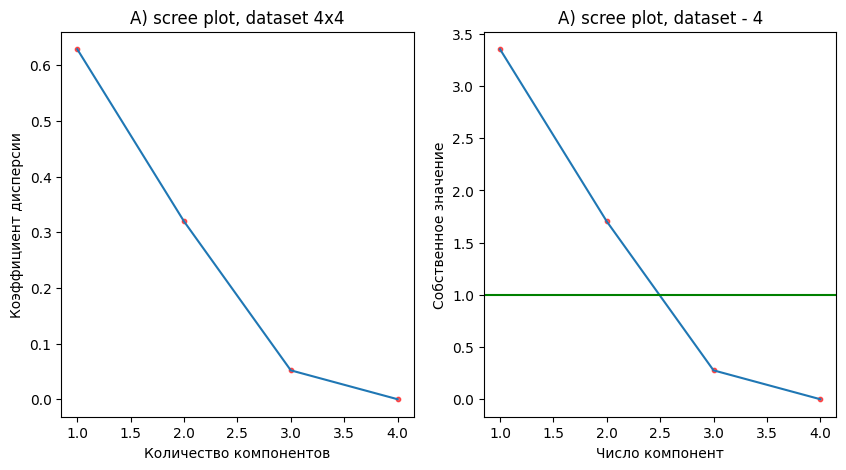

a > количество переменных  =>  a = кол-во переменных


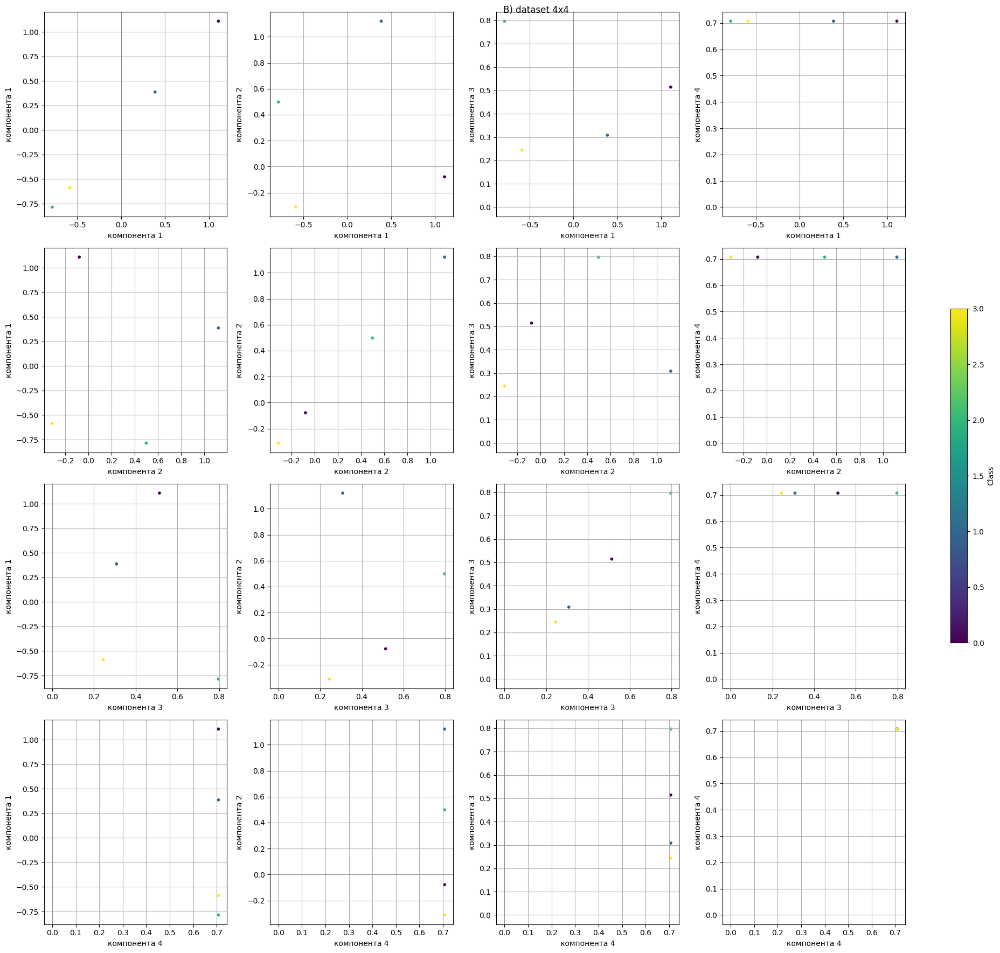

a > количество переменных  =>  a = кол-во переменных
0.7071067811865476 0.7071067811865476
0.7071067811865476 0.7071067811865476
-0.7071067811865476 -0.7071067811865476
-0.7071067811865476 -0.7071067811865476
0.8020757488993637 -0.5972223145760085
0.8833081942171953 0.4687927410154274
-0.23901523457455612 0.9710158174001441
-0.8833081942171955 -0.4687927410154271
0.5674403894384716 0.8234144791257412
0.9230319959757556 -0.3847231919250683
-0.3391566535610989 0.9407299104127799
-0.9230319959757554 0.38472319192506854
1.0 0.0
0.6381745443559798 0.769891713772812
-1.0 -1.671918177168146e-15
-0.6381745443559795 0.7698917137728123
-0.5972223145760085 0.8020757488993637
0.4687927410154274 0.8833081942171953
0.9710158174001441 -0.23901523457455612
-0.4687927410154271 -0.8833081942171955
-0.7071067811865476 -0.7071067811865476
0.7071067811865476 0.7071067811865476
0.7071067811865475 0.7071067811865475
-0.7071067811865476 -0.7071067811865476
-0.4565304739289481 0.8897077758310366
0.786457675976

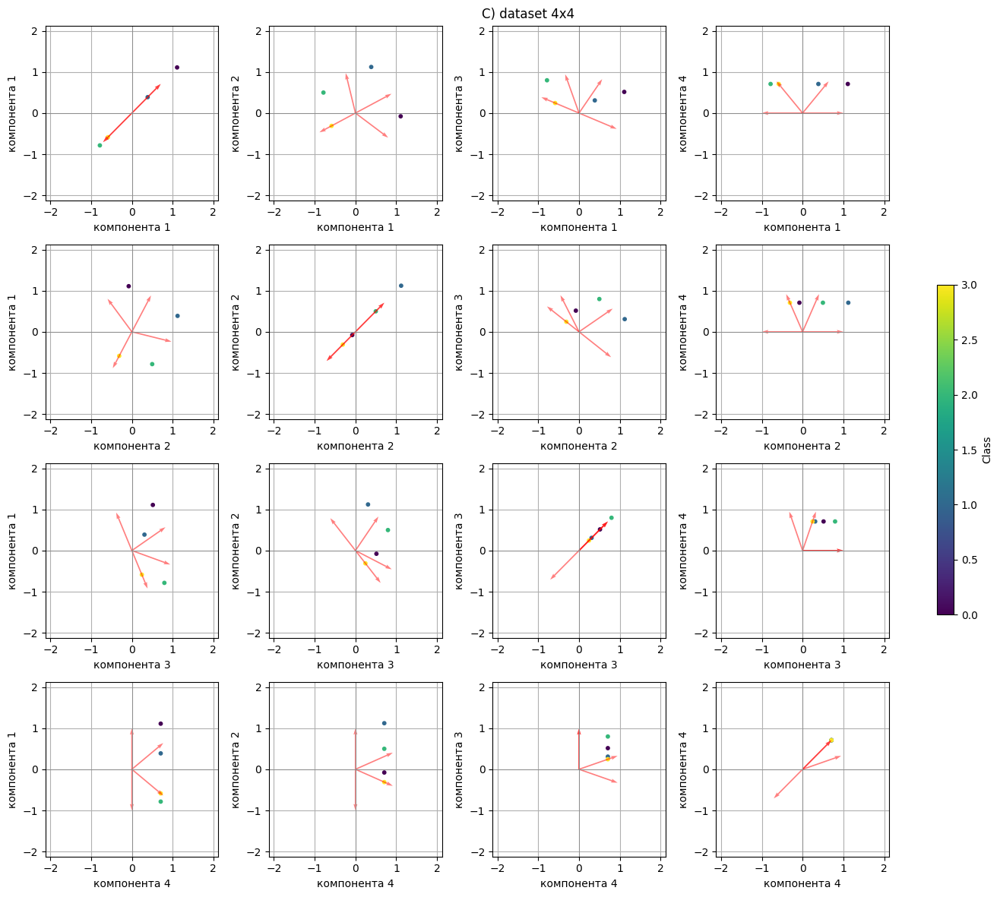

c+a > количество переменных  =>  break


<Figure size 1400x1200 with 0 Axes>

In [8]:
for name, dataset in datasets.items():
    print(f'dataset {name}x{name}')
    task_2(dataset, a = 6, c = 200)
    break

In [9]:
-0.1*2+0.8*4+0.6*6

6.6

dataset 4x4
[5.33333333 5.33333333 5.33333333 5.33333333]
[0.1875 0.1875 0.1875 0.1875]
[3.35315858e+00 1.70353103e+00 2.76643715e-01 2.95451352e-34]
[6.28717235e-01 3.19412069e-01 5.18706965e-02 5.53971286e-35]
Количество компонентов по методу Кайзера: 2


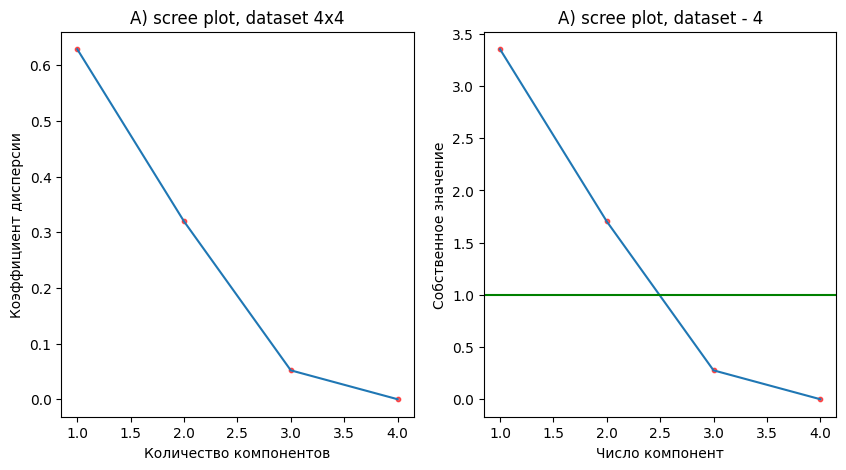

a > количество переменных  =>  a = кол-во переменных


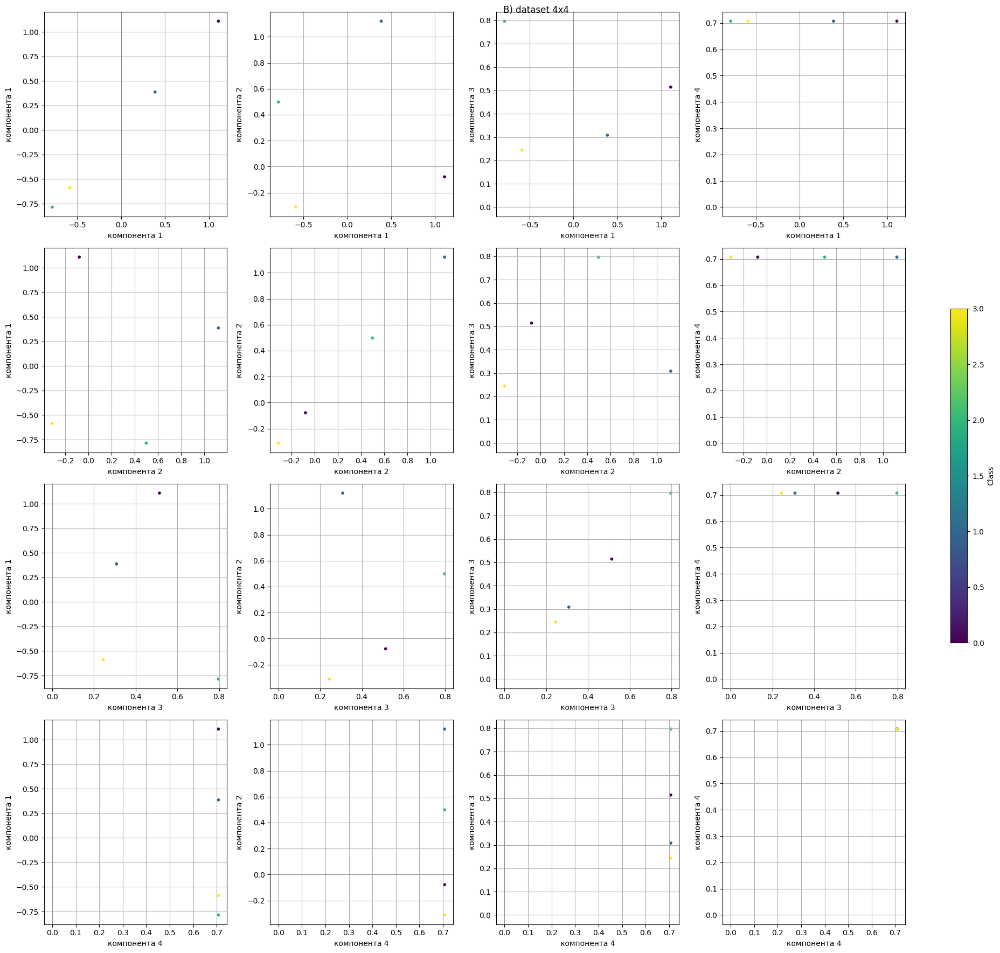

a > количество переменных  =>  a = кол-во переменных
0.7071067811865476 0.7071067811865476
0.7071067811865476 0.7071067811865476
-0.7071067811865476 -0.7071067811865476
-0.7071067811865476 -0.7071067811865476
0.8020757488993637 -0.5972223145760085
0.8833081942171953 0.4687927410154274
-0.23901523457455612 0.9710158174001441
-0.8833081942171955 -0.4687927410154271
0.5674403894384716 0.8234144791257412
0.9230319959757556 -0.3847231919250683
-0.3391566535610989 0.9407299104127799
-0.9230319959757554 0.38472319192506854
1.0 0.0
0.6381745443559798 0.769891713772812
-1.0 -1.671918177168146e-15
-0.6381745443559795 0.7698917137728123
-0.5972223145760085 0.8020757488993637
0.4687927410154274 0.8833081942171953
0.9710158174001441 -0.23901523457455612
-0.4687927410154271 -0.8833081942171955
-0.7071067811865476 -0.7071067811865476
0.7071067811865476 0.7071067811865476
0.7071067811865475 0.7071067811865475
-0.7071067811865476 -0.7071067811865476
-0.4565304739289481 0.8897077758310366
0.786457675976

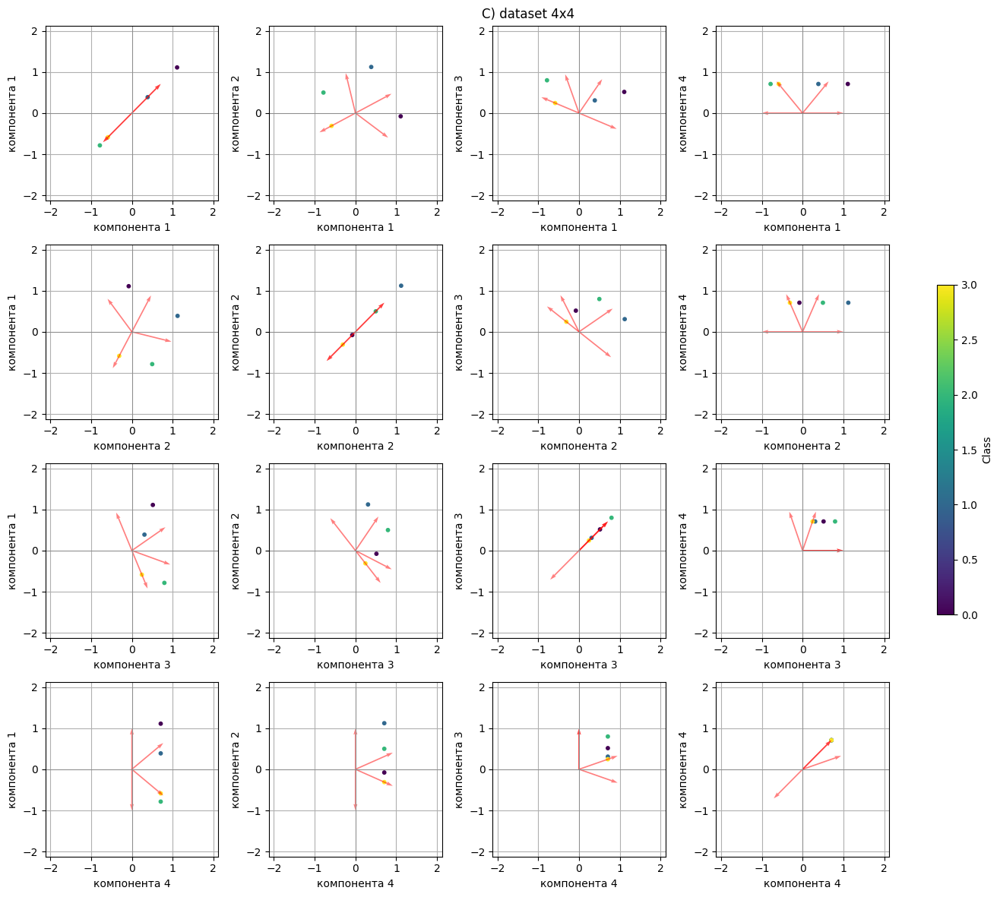

c+a > количество переменных  =>  break
dataset 16x16
[17.06666667 17.06666667 17.06666667 17.06666667 17.06666667 17.06666667
 17.06666667 17.06666667 17.06666667 17.06666667 17.06666667 17.06666667
 17.06666667 17.06666667 17.06666667 17.06666667]
[0.05859375 0.05859375 0.05859375 0.05859375 0.05859375 0.05859375
 0.05859375 0.05859375 0.05859375 0.05859375 0.05859375 0.05859375
 0.05859375 0.05859375 0.05859375 0.05859375]
[8.50320047e+00 4.28174524e+00 1.44653291e+00 7.33291546e-01
 5.12071792e-01 3.70158299e-01 2.88360543e-01 2.37959716e-01
 2.13776070e-01 1.90871069e-01 1.00700050e-01 7.00721012e-02
 4.96669046e-02 3.82218523e-02 3.00381019e-02 1.00568005e-33]
[4.98234403e-01 2.50883510e-01 8.47577878e-02 4.29663015e-02
 3.00042066e-02 2.16889628e-02 1.68961255e-02 1.39429521e-02
 1.25259416e-02 1.11838517e-02 5.90039354e-03 4.10578718e-03
 2.91017019e-03 2.23956166e-03 1.76004504e-03 5.89265657e-35]
Количество компонентов по методу Кайзера: 3


<Figure size 1400x1200 with 0 Axes>

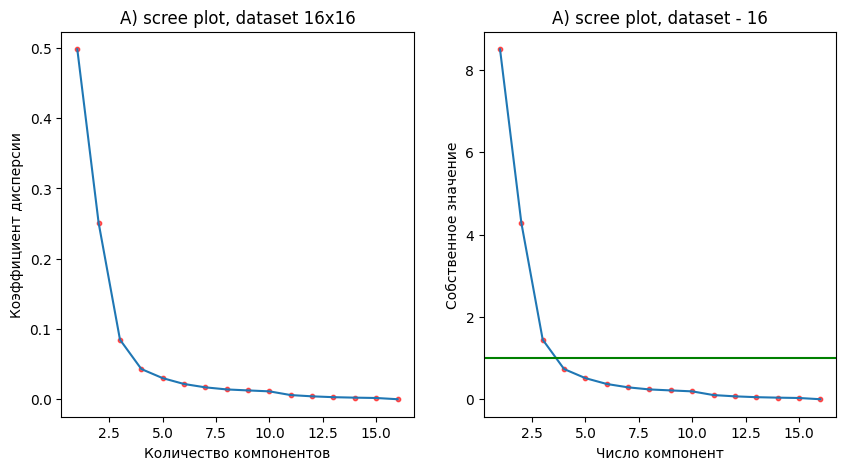

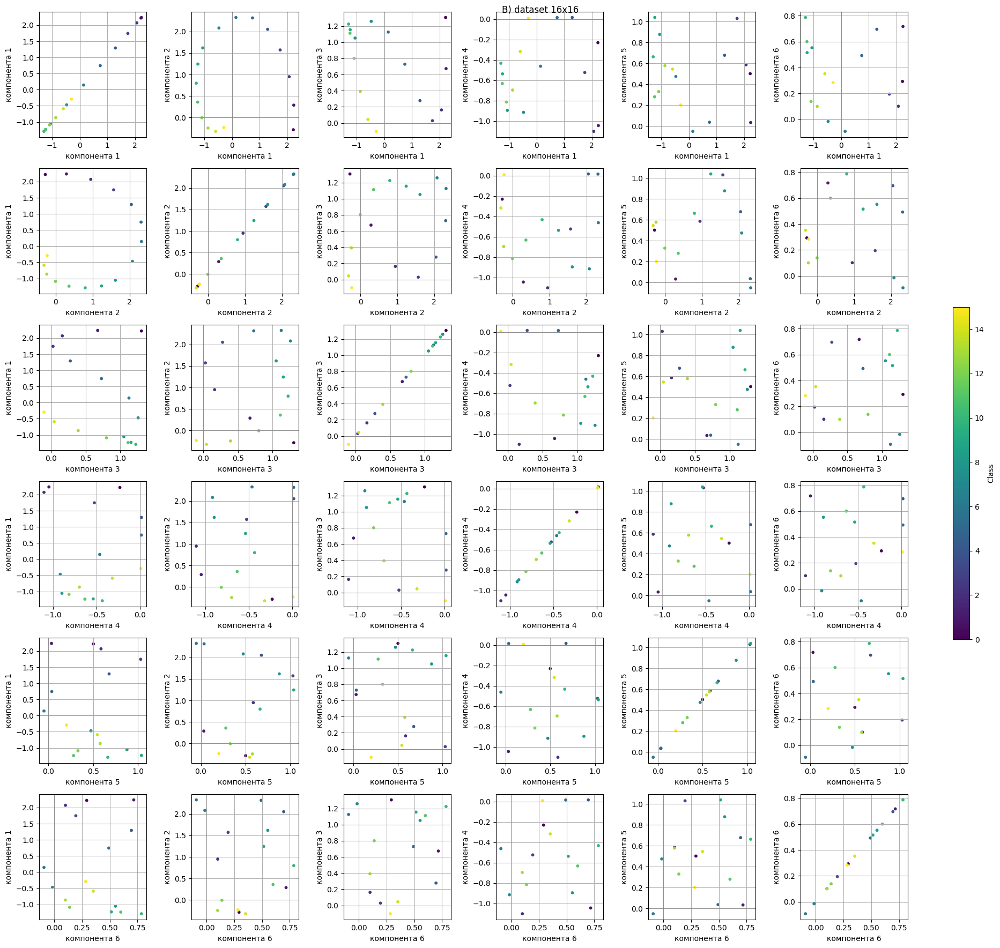

a > количество переменных  =>  a = кол-во переменных
0.7071067811865475 0.7071067811865475
0.7071067811865476 0.7071067811865476
0.7071067811865476 0.7071067811865476
0.7071067811865476 0.7071067811865476
0.7071067811865476 0.7071067811865476
0.7071067811865476 0.7071067811865476
0.7071067811865476 0.7071067811865476
0.7071067811865475 0.7071067811865475
0.7071067811865476 0.7071067811865476
0.7071067811865476 0.7071067811865476
-0.7071067811865475 -0.7071067811865475
-0.7071067811865476 -0.7071067811865476
-0.7071067811865475 -0.7071067811865475
-0.7071067811865476 -0.7071067811865476
-0.7071067811865476 -0.7071067811865476
-0.7071067811865475 -0.7071067811865475
0.6273660466810634 -0.7787244977986589
0.7231061011564741 -0.6907369734351008
0.8322634396440626 -0.5543803450987722
0.9361742171153551 -0.35153639243818274
0.9964258642876124 -0.08447187093159901
0.9795588693343087 0.20115770308017164
0.8960182822349851 0.4440171594664633
0.7849044730206094 0.6196167914382561
0.4261696558864

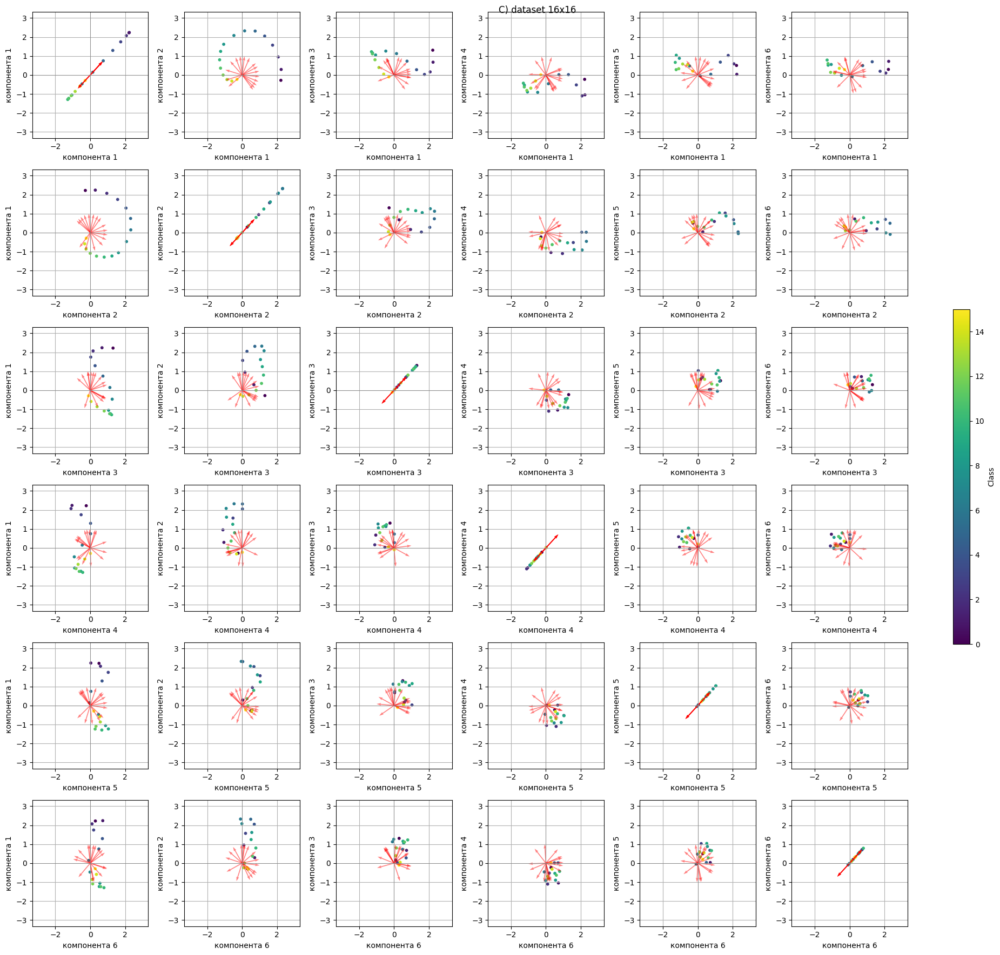

c+a > количество переменных  =>  break
dataset 256x256
[257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.00392157 257.00392157 257.00392157 257.00392157
 257.00392157 257.003

<Figure size 2000x1800 with 0 Axes>

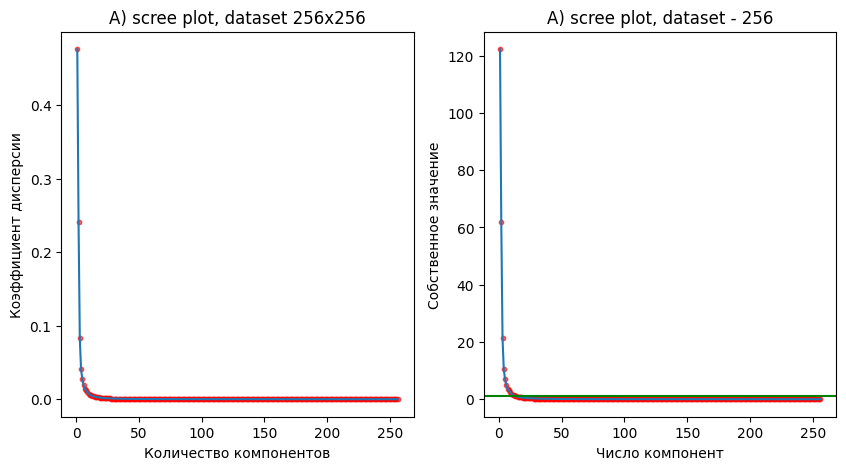

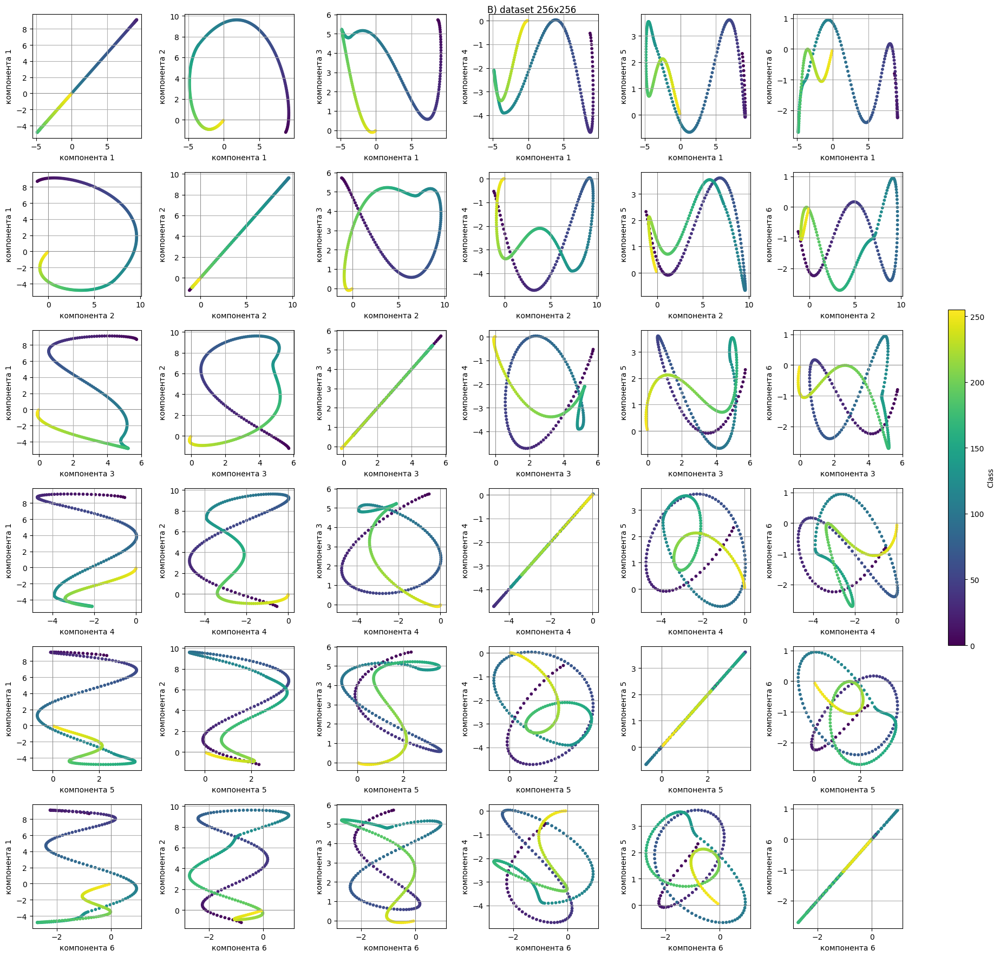

Выходные данные были обрезаны до нескольких последних строк (5000).
0.2887039099567759 -0.9574184311865267
0.3081750419919446 -0.9513296712986846
0.32869972737571285 -0.9444344811701508
0.3504209827592453 -0.9365922991579873
0.3734841061317753 -0.9276365788750187
0.3980357660366337 -0.9173698975634802
0.4242215946649492 -0.9055584125940896
0.4521817937827864 -0.8919257958885266
0.34421314302614314 -0.9388915337609899
0.2571795499312273 -0.966363637093807
0.18558023766715281 -0.982629113850899
0.1249142952055551 -0.9921675356779719
0.0717624375313397 -0.9974217525999525
0.02351433605360126 -0.9997234997737916
-0.02191626827893698 -0.9997598097466839
-0.06632852189374366 -0.9977978388347968
-0.11143558838007518 -0.9937716587035406
-0.15905836338714718 -0.9872691816503756
-0.2113454917932926 -0.9774114195663213
-0.2710582720590614 -0.9625629398373676
-0.3419552699619514 -0.9397162302233844
-0.42924311239750534 -0.9031889893368401
-0.5396753520607708 -0.8418732175203599
-0.679204363626149 

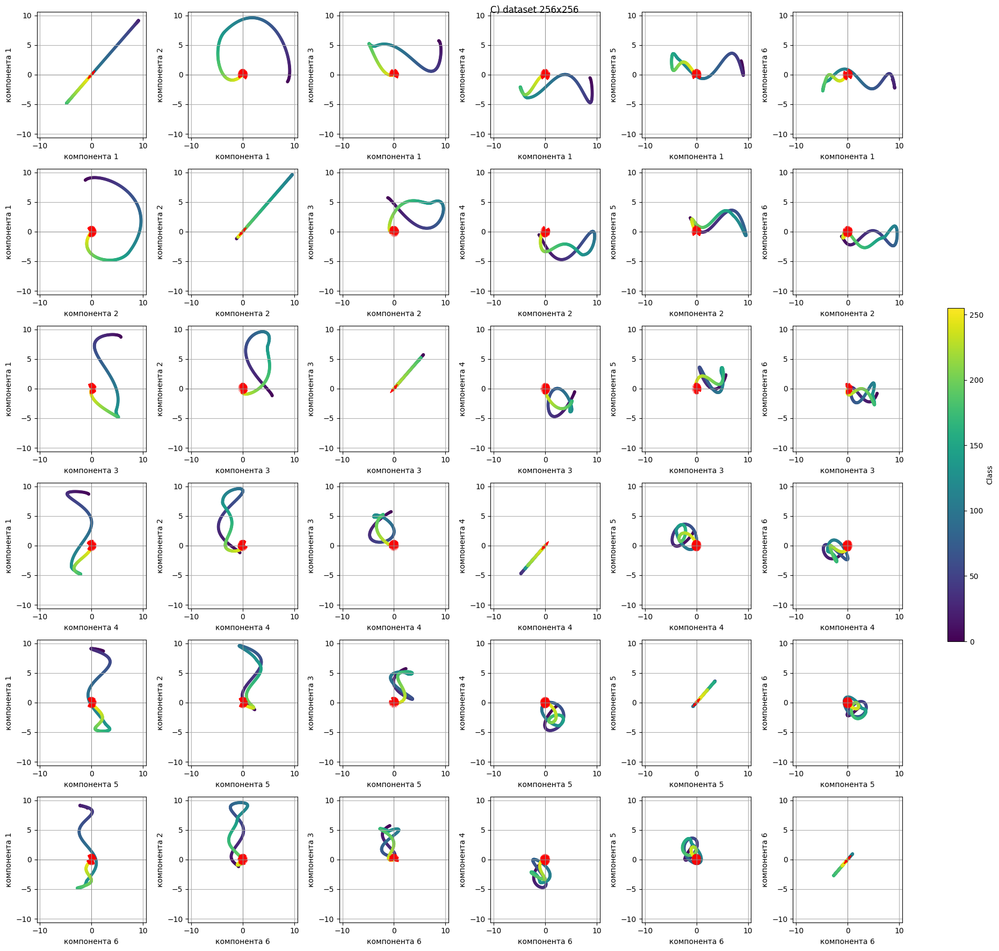

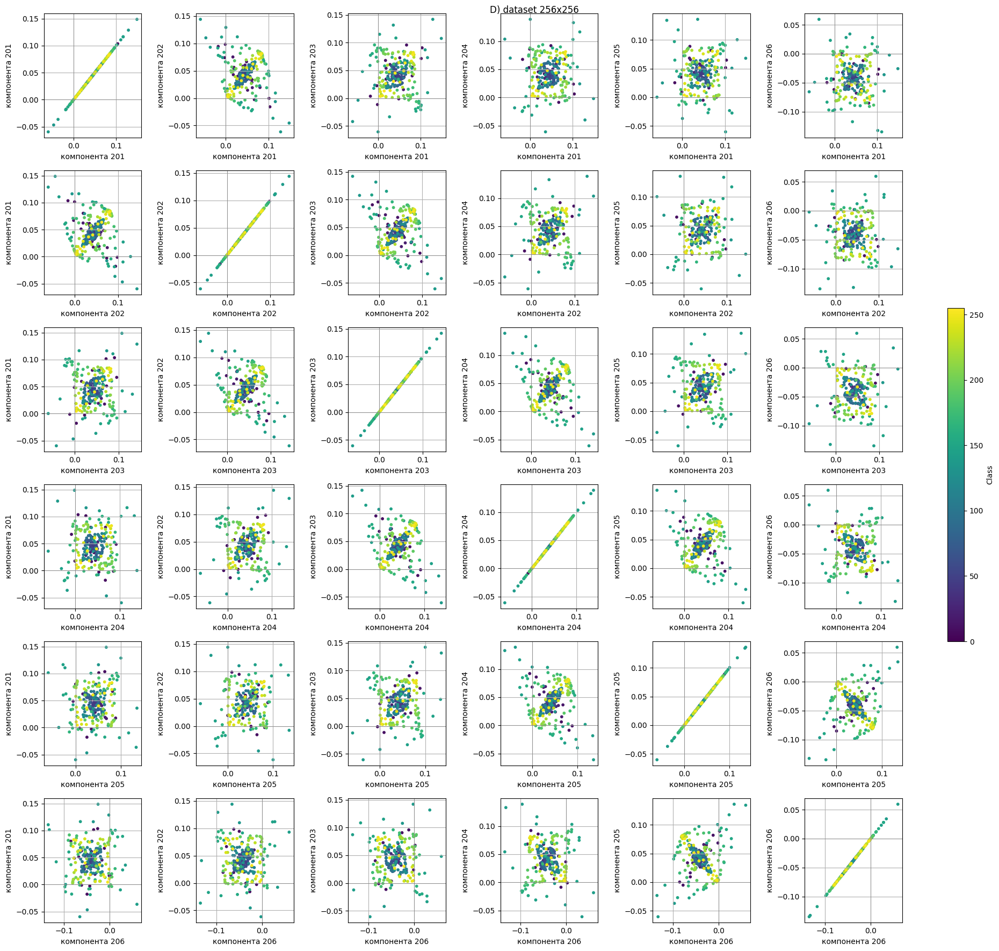

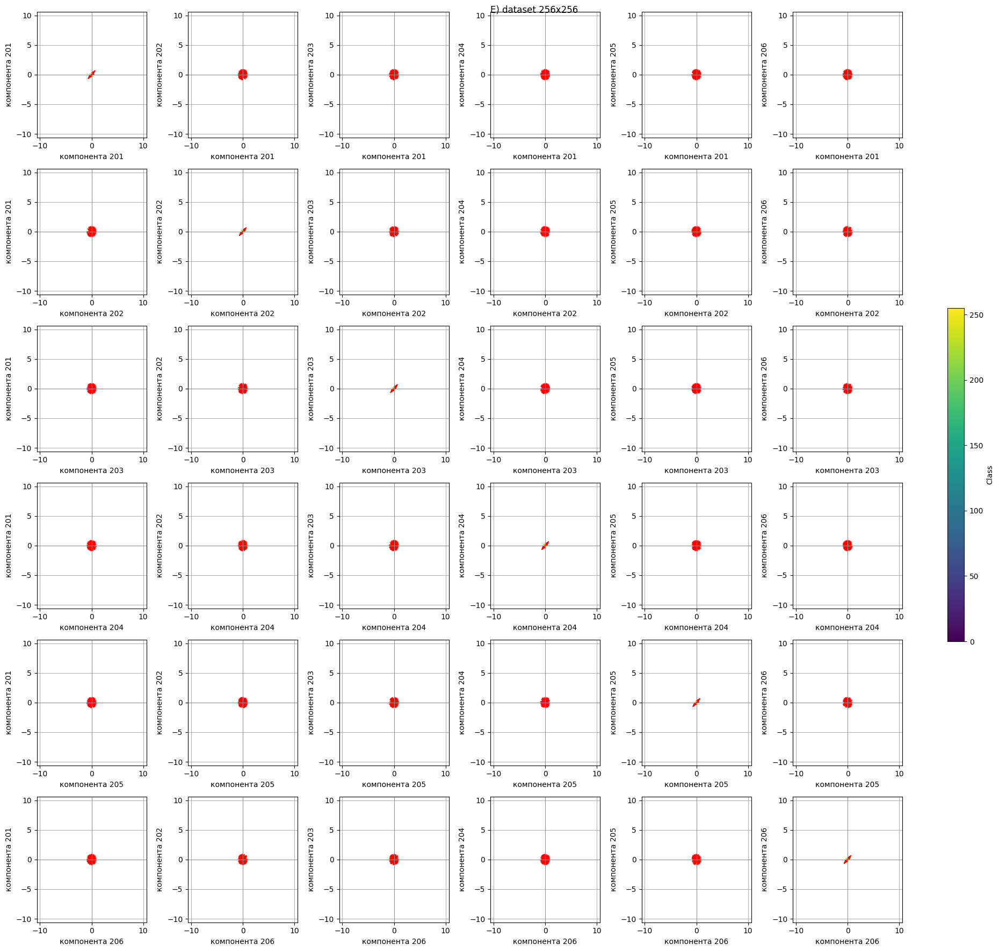

In [10]:
for name, dataset in datasets.items():
    print(f'dataset {name}x{name}')
    task_2(dataset, a = 6, c = 200)

# 3.

In [ ]:
import umap
from sklearn.manifold import TSNE

dataset 4x4


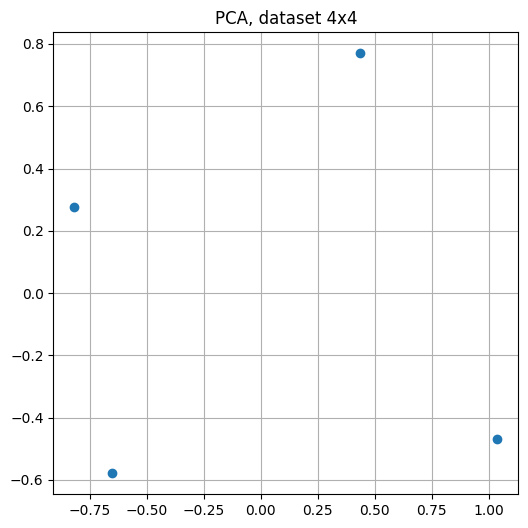

random_state 42


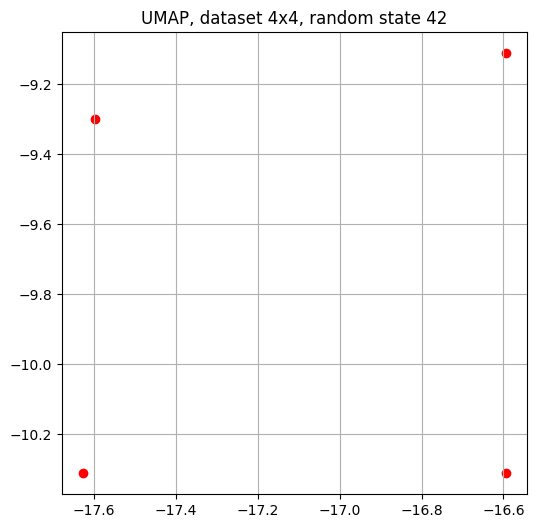

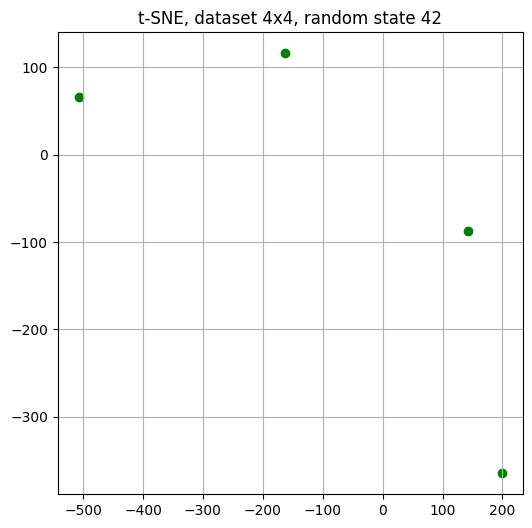

random_state 52


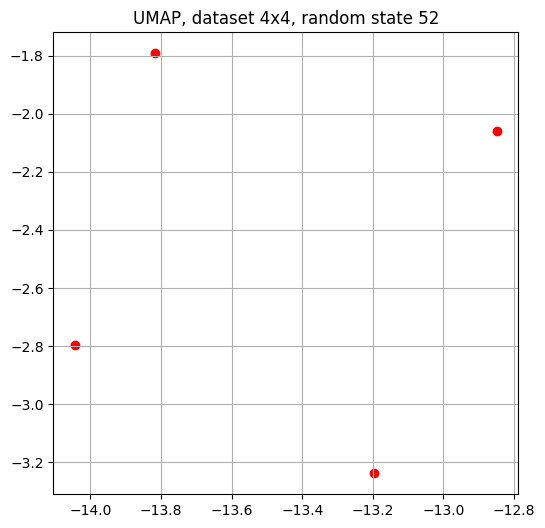

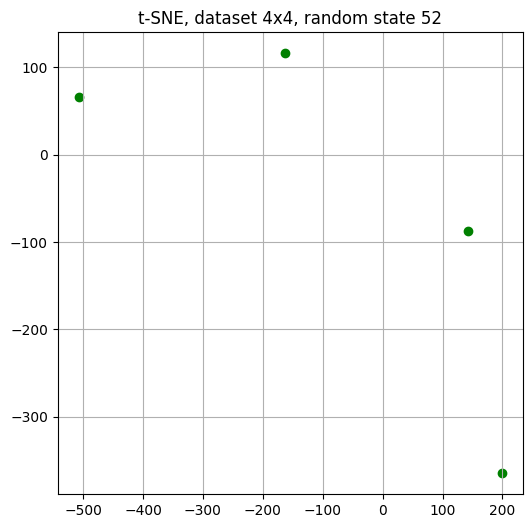

random_state 100


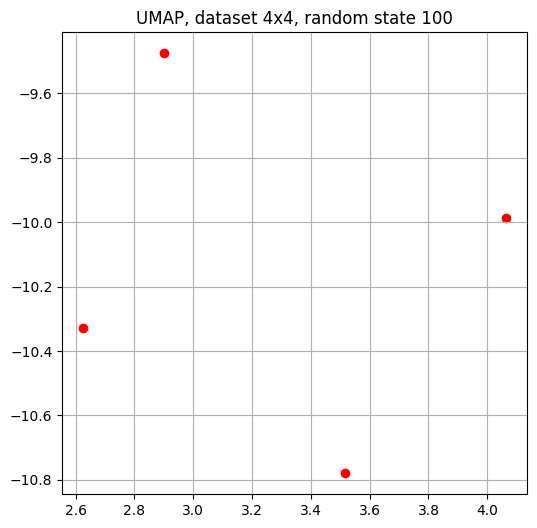

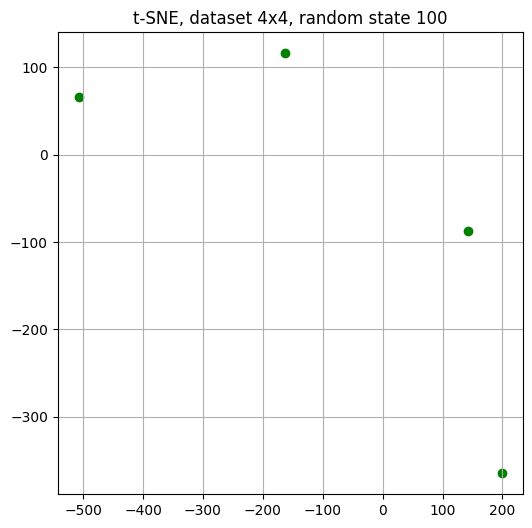

dataset 16x16


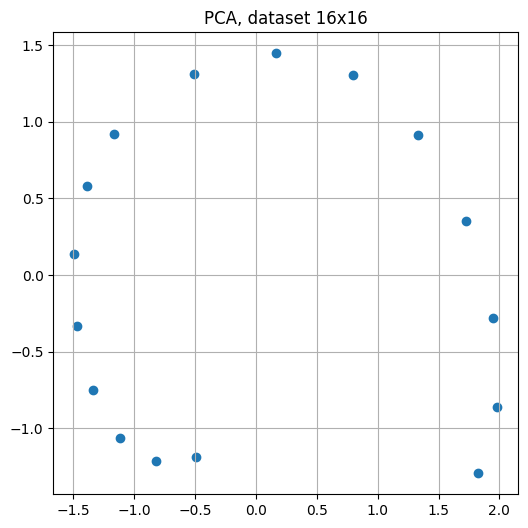

random_state 42


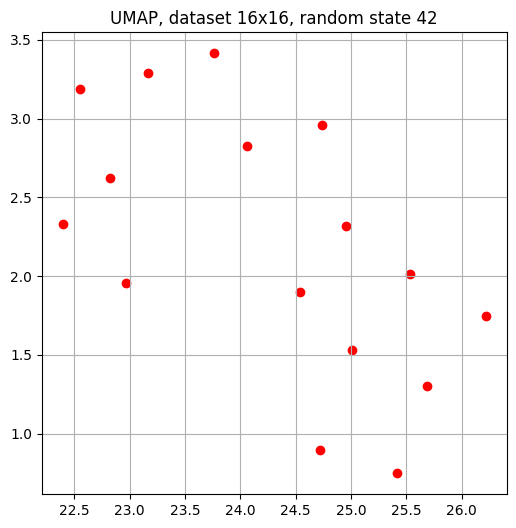

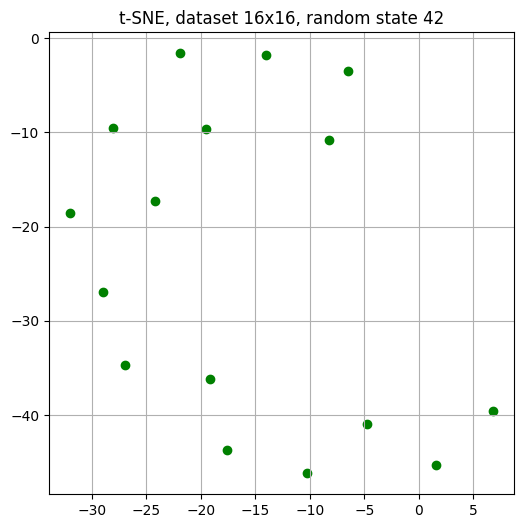

random_state 52


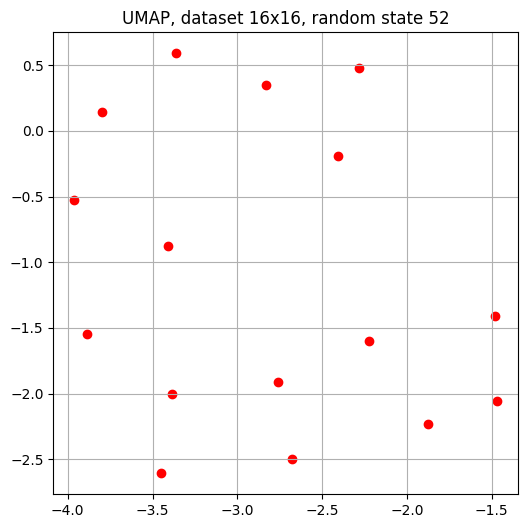

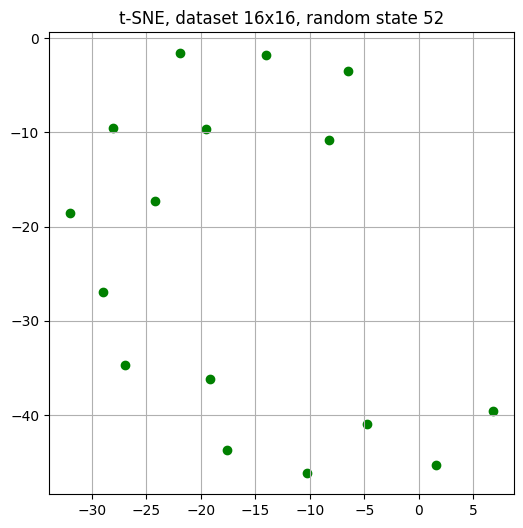

random_state 100


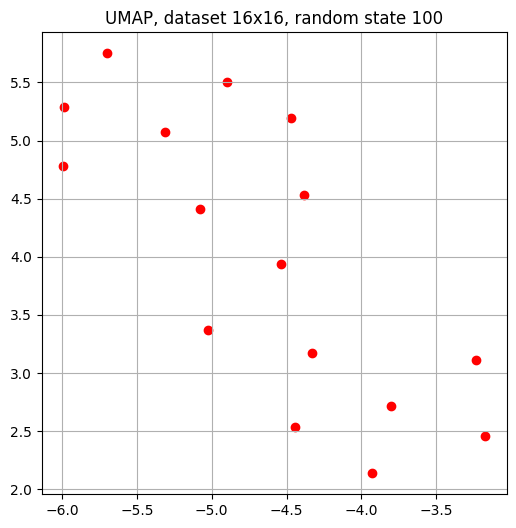

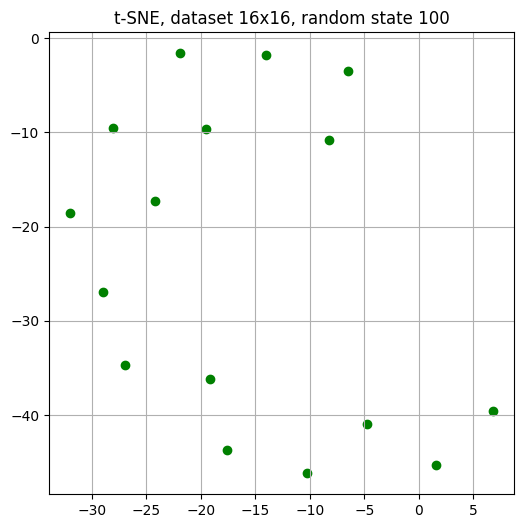

dataset 256x256


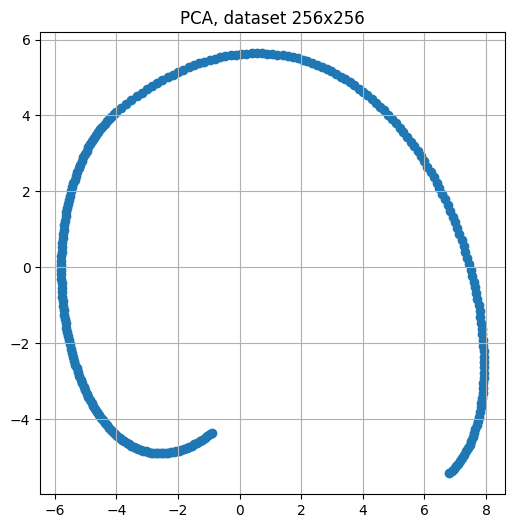

random_state 42


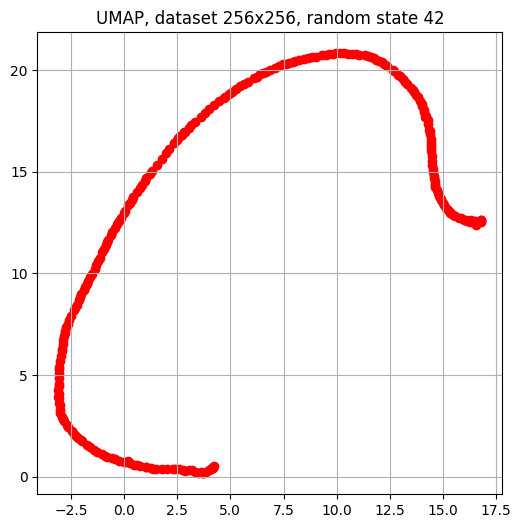

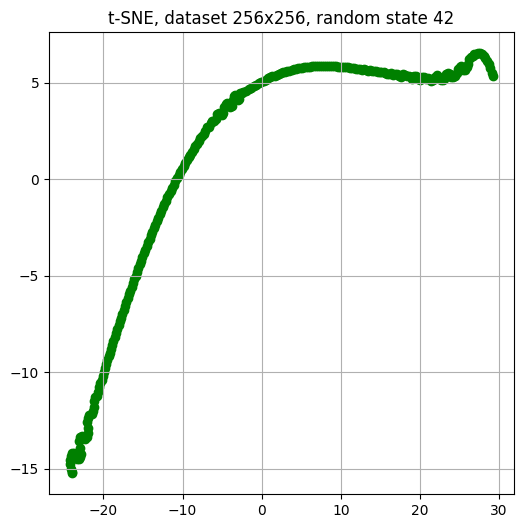

random_state 52


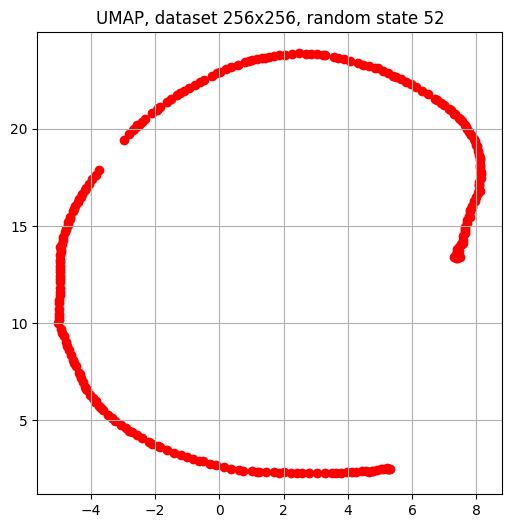

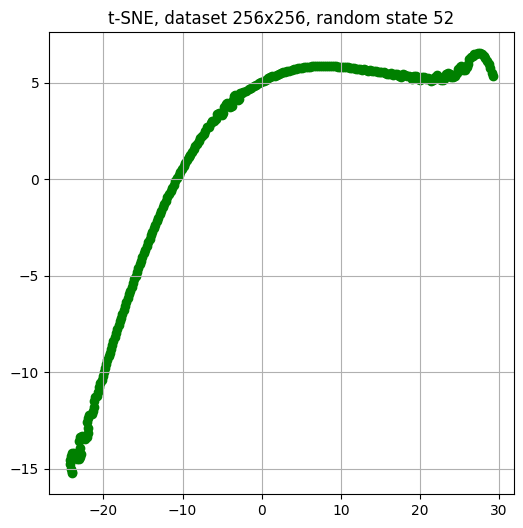

random_state 100


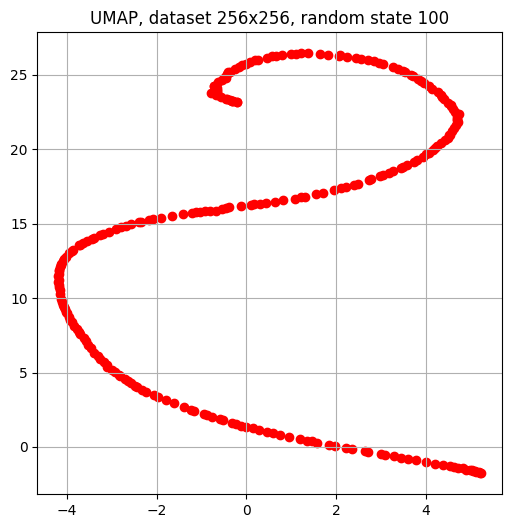

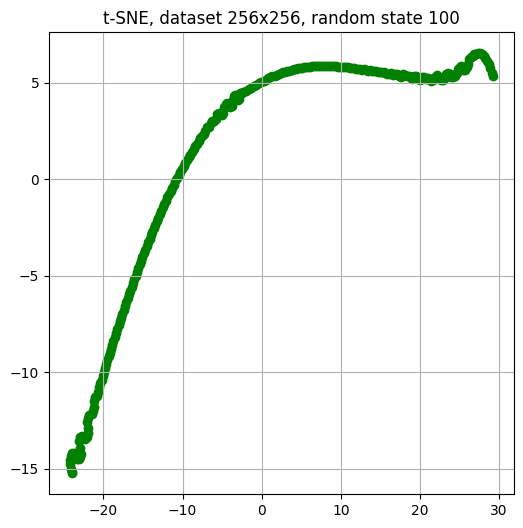

In [ ]:
random_states = [42, 52, 100]
n_components = 2

for name, dataset in datasets.items():
    scaler = StandardScaler()
    dataset_scaled = scaler.fit_transform(dataset)

    pca_model = PCA(n_components=n_components)
    data_pca = pca_model.fit_transform(dataset)

    print(f"dataset {name}x{name}")
    plt.figure(figsize=(6, 6))
    plt.scatter(data_pca[:, 0], data_pca[:, 1])
    plt.title(f"PCA, dataset {name}x{name}")
    plt.grid()
    plt.show()

    for random_state in random_states:
        print(f"random_state {random_state}")

        umap_model = umap.UMAP(n_components=n_components, random_state=random_state, n_neighbors=15)
        data_umap = umap_model.fit_transform(dataset_scaled)

        plt.figure(figsize=(6, 6))
        plt.scatter(data_umap[:, 0], data_umap[:, 1], color='red')
        plt.title(f"UMAP, dataset {name}x{name}, random state {random_state}")
        plt.grid()
        plt.show()

        tsne_model = TSNE(n_components=n_components, random_state=random_state)
        perplexity_value = min(30, dataset_scaled.shape[0] // 2)
        tsne_model.perplexity = perplexity_value
        data_tsne = tsne_model.fit_transform(dataset_scaled)

        plt.figure(figsize=(6, 6))
        plt.scatter(data_tsne[:, 0], data_tsne[:, 1], color='green')
        plt.title(f"t-SNE, dataset {name}x{name}, random state {random_state}")
        plt.grid()
        plt.show()

# 4.

In [ ]:
import random

d = 10
num_points = 10

points = []
labels = []

for x, row in datasets['256'].iterrows():
    for y, value in row.items():
        cluster_points, _ = make_blobs(n_samples=num_points, centers=[(y, x)], cluster_std=d)
        points.extend(cluster_points)
        if value == 1:
            labels.extend([1]*10)
        else:
            labels.extend([0]*10)

df_256v = pd.DataFrame(points, columns=['x', 'y'])
df_256v['labels'] = labels

df_256v

,x,y,labels
0,10.825856,24.108981,1
1,-10.910842,-11.697635,1
2,6.023836,-8.382176,1
3,-2.602696,-8.468613,1
4,28.519567,11.689514,1
...,...,...,...
655355,255.785851,246.084314,1
655356,245.702016,245.497791,1
655357,253.798704,240.292947,1
655358,245.803583,247.644794,1


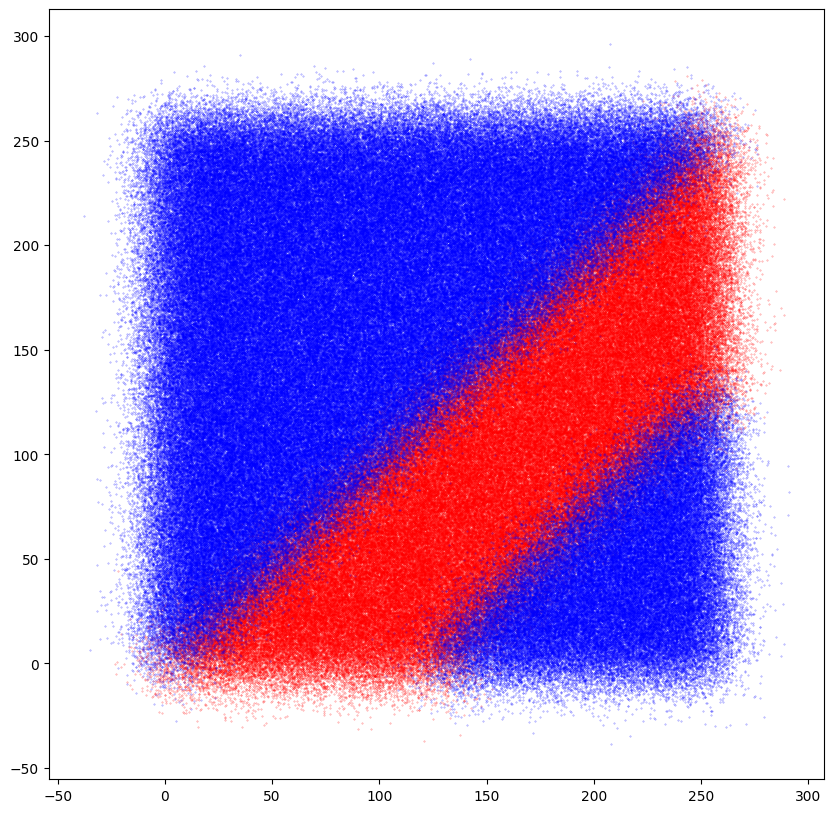

In [ ]:
plt.figure(figsize=(10, 10))
plt.scatter(df_256v[df_256v['labels'] == 1]['x'], df_256v[df_256v['labels'] == 1]['y'], s=0.1, color='red', alpha=0.5)
plt.scatter(df_256v[df_256v['labels'] == 0]['x'], df_256v[df_256v['labels'] == 0]['y'], s=0.1, color='blue', alpha=0.5)
plt.show()

# 5.

In [ ]:
def task_4_8(dataset, a=6, c=200):
    dataset_1 = dataset.copy()
    dataset_1['class'] = dataset_1.index
    dataset_scaler = StandardScaler()
    dataset_scaler.fit(dataset)
    dataset_scaled = dataset_scaler.transform(dataset)

    pca = PCA()
    pca.fit(dataset_scaled)

    # A) Scree plot
    explaned_variance_ratio = pca.explained_variance_ratio_
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f'A) scree plot, dataset {name}x{name}')
    plt.plot(np.arange(1, len(explaned_variance_ratio) + 1), explaned_variance_ratio)
    plt.scatter(np.arange(1, len(explaned_variance_ratio) + 1), explaned_variance_ratio, color='red', s=10, alpha=0.6)
    plt.xlabel('Number of components')
    plt.ylabel('Explained variance ratio')

    eigenvalues = pca.explained_variance_
    print(eigenvalues/explaned_variance_ratio)
    print(explaned_variance_ratio/eigenvalues)
    print(eigenvalues)
    print(explaned_variance_ratio)
    components_kaiser = sum(eigenvalues > 1)

    print(f"Количество компонентов по методу Кайзера: {components_kaiser}")

    plt.subplot(1, 2, 2)
    plt.title(f'A) scree plot, dataset - {name}')
    plt.plot(np.arange(1, len(eigenvalues) + 1), eigenvalues)
    plt.scatter(np.arange(1, len(eigenvalues) + 1), eigenvalues, color='red', s=10, alpha=0.6)
    plt.axhline(y=1, color='green', linestyle='-', label='Кайзер')
    plt.xlabel('Число компонень')
    plt.ylabel('Собственное значение')
    plt.show()

    # B)
    plt.figure(figsize=(a*3+2, a*3))
    plt.suptitle(f'B) dataset {name}x{name}')

    if len(explaned_variance_ratio) < a:
           print(f'a > количество переменных  =>  a = кол-во переменных')
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    for i in range(a):
        for j in range(a):
            plt.subplot(a, a, i*a+j+1)
            scatter = plt.scatter(pca_result[:, i], pca_result[:, j], c=dataset_1['class'],  cmap='viridis', s=10)
            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.colorbar(scatter, ax=plt.gcf().axes, orientation='vertical', fraction=0.02, pad=0.02, label='Class')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

    # C)
    plt.figure(figsize=(a*3+2, a*3))
    plt.suptitle(f'C) dataset {name}x{name}')

    if len(explaned_variance_ratio) < c+a:
           print(f'a > количество переменных  =>  a = кол-во переменных')
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    lim_value = 0
    for i in range(a):
        for j in range(a):
            plt.subplot(a, a, i*a+j+1)
            scatter = plt.scatter(pca_result[:, i], pca_result[:, j], c=dataset_1['class'],  cmap='viridis', s=10)
            for k in range(dataset.shape[1]):
                x, y = pca.components_[i, k], pca.components_[j, k]
                length = np.linalg.norm([x, y])
                lim_value = 0
                vec = [x, y]
                norm = np.sqrt(vec[0]**2 + vec[1]**2)
                if norm != 0:
                    norm_vec = vec / norm
                x_norm, y_norm = norm_vec[0], norm_vec[1]
                plt.quiver(0, 0, x_norm, y_norm, angles='xy', scale_units='xy', scale=1, linewidth=0.1, alpha=0.5, color='red')
                print(x_norm, y_norm)
            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            lim_value = max(lim_value, np.max(np.abs(pca_result)))
            plt.xlim([-lim_value-1, lim_value+1])
            plt.ylim([-lim_value-1, lim_value+1])
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.colorbar(scatter, ax=plt.gcf().axes, orientation='vertical', fraction=0.02, pad=0.02, label='Class')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

    # D)
    plt.figure(figsize=(a*3+2, a*3))
    plt.suptitle(f'D) dataset {name}x{name}')

    if len(explaned_variance_ratio) < c+a:
           print(f'c+a > количество переменных  =>  break')
           return
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=c+a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    for i in range(c, c+a):
        for j in range(c, c+a):
            plt.subplot(a, a, (i-c)*a+(j-c)+1)
            scatter = plt.scatter(pca_result[:, i], pca_result[:, j], c=dataset_1['class'],  cmap='viridis', s=10)
            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.colorbar(scatter, ax=plt.gcf().axes, orientation='vertical', fraction=0.02, pad=0.02, label='Class')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

    # E)
    plt.figure(figsize=(a*3+2, a*3))
    plt.suptitle(f'E) dataset {name}x{name}')

    if len(explaned_variance_ratio) < a:
           print(f'c+a > количество переменных  =>  break')
           return
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=c+a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    lim_value = 0
    for i in range(c, c+a):
        for j in range(c, c+a):
            plt.subplot(a, a, (i-c)*a+(j-c)+1)
            scatter = plt.scatter(pca_result[:, i], pca_result[:, j], c=dataset_1['class'],  cmap='viridis', s=10)
            for k in range(dataset.shape[1]):
                x, y = pca.components_[i, k], pca.components_[j, k]
                length = np.linalg.norm([x, y])
                lim_value = 0
                vec = [x, y]
                norm = np.sqrt(vec[0]**2 + vec[1]**2)
                if norm != 0:
                    norm_vec = vec / norm
                x_norm, y_norm = norm_vec[0], norm_vec[1]
                plt.quiver(0, 0, x_norm, y_norm, angles='xy', scale_units='xy', scale=1, linewidth=0.1, alpha=0.5, color='red')

            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            lim_value = max(lim_value, np.max(np.abs(pca_result)))
            plt.xlim([-lim_value-1, lim_value+1])
            plt.ylim([-lim_value-1, lim_value+1])
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.colorbar(scatter, ax=plt.gcf().axes, orientation='vertical', fraction=0.02, pad=0.01, label='Class')
    plt.tight_layout(rect=[0, 0, 0.85, 1])
    plt.show()

[3.00000458 3.00000458 3.00000458]
[0.33333282 0.33333282 0.33333282]
[1.41502082 0.99992906 0.58505469]
[0.47167289 0.33330918 0.19501793]
Количество компонентов по методу Кайзера: 1


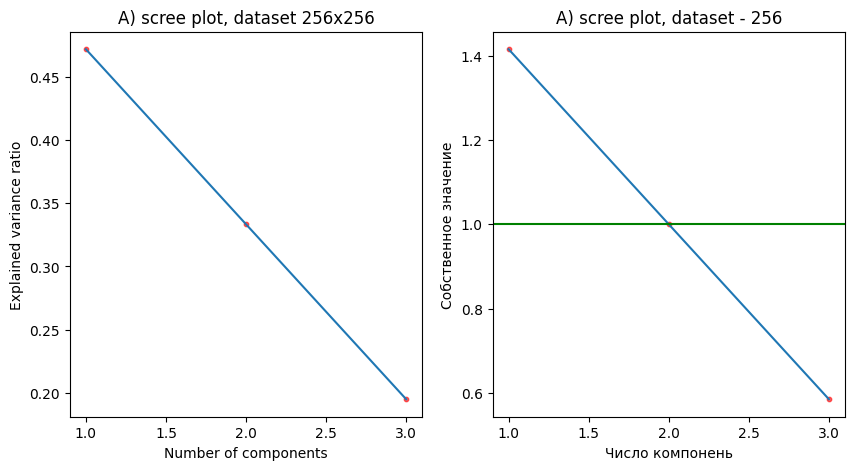

a > количество переменных  =>  a = кол-во переменных


KeyboardInterrupt: 

In [ ]:
task_4_8(df_256v)

# 6.

In [ ]:
datasets['4'].index

RangeIndex(start=0, stop=4, step=1)

In [ ]:
dataset_scaled[1]

array([ 1.73060985, -1.19893628, -0.77621125])

In [ ]:
df_256v

,x,y,labels
0,10.825856,24.108981,1
1,-10.910842,-11.697635,1
2,6.023836,-8.382176,1
3,-2.602696,-8.468613,1
4,28.519567,11.689514,1
...,...,...,...
655355,255.785851,246.084314,1
655356,245.702016,245.497791,1
655357,253.798704,240.292947,1
655358,245.803583,247.644794,1


In [ ]:
random_states = [42, 52, 100]
n_components = 2
dataset_1 = df_256v.copy()
dataset_1['class'] = dataset_1['labels']
for name, dataset in [('256v', df_256v)]:
    scaler = StandardScaler()
    dataset_scaled = scaler.fit_transform(dataset)

    indices = np.random.choice(dataset_scaled.shape[0], 10000, replace=False)
    dataset_scaled = dataset_scaled[indices]

    pca_model = PCA(n_components=n_components)
    data_pca = pca_model.fit_transform(dataset_scaled)

    print(f"dataset {name}x{name}")
    plt.figure(figsize=(6, 6))
    plt.scatter(data_pca[df_256v['labels']==1][:, 0], data_pca[df_256v['labels']==1][:, 1])
    plt.scatter(data_pca[df_256v['labels']==0][:, 0], data_pca[df_256v['labels']==0][:, 1])
    plt.title(f"PCA, dataset {name}x{name}")
    plt.grid()
    plt.show()

    for random_state in random_states:
        print(f"random_state {random_state}")

        umap_model = umap.UMAP(n_components=n_components, random_state=random_state, n_neighbors=2)
        data_umap = umap_model.fit_transform(dataset_scaled)

        plt.figure(figsize=(6, 6))
        plt.scatter(data_umap[df_256v['labels']==1][:, 0], data_umap[df_256v['labels']==1][:, 1], color = 'red')
        plt.scatter(data_umap[df_256v['labels']==0][:, 0], data_umap[df_256v['labels']==0][:, 1], color = 'blue')
        plt.title(f"UMAP, dataset {name}x{name}, random state {random_state}")
        plt.grid()
        plt.show()

        tsne_model = TSNE(n_components=n_components, random_state=random_state)
        perplexity_value = min(30, dataset_scaled.shape[0] // 2)
        tsne_model.perplexity = perplexity_value
        data_tsne = tsne_model.fit_transform(dataset_scaled)

        plt.figure(figsize=(6, 6))
        plt.scatter(data_tsne[df_256v['labels']==1][:, 0], data_tsne[df_256v['labels']==1][:, 1], color='red')
        plt.scatter(data_tsne[df_256v['labels']==0][:, 0], data_tsne[df_256v['labels']==0][:, 1], color='blue')
        plt.title(f"t-SNE, dataset {name}x{name}, random state {random_state}")
        plt.grid()
        plt.show()

dataset 256vx256v


IndexError: boolean index did not match indexed array along dimension 0; dimension is 10000 but corresponding boolean dimension is 655360

<Figure size 600x600 with 0 Axes>

# 7.

In [ ]:
df_kaggle = pd.read_csv('all_youtube_analytics.csv')
df_kaggle

,video_id,day,views,redViews,comments,likes,dislikes,videosAddedToPlaylists,videosRemovedFromPlaylists,shares,...,annotationClicks,annotationCloses,cardClickRate,cardTeaserClickRate,cardImpressions,cardTeaserImpressions,cardClicks,cardTeaserClicks,subscribersGained,subscribersLost
0,YuQaT52VEwo,2019-09-06,8.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,YuQaT52VEwo,2019-09-07,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,SfTEVOQP-Hk,2019-09-07,6.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,YuQaT52VEwo,2019-09-08,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,SfTEVOQP-Hk,2019-09-08,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234884,jCBMPRa88_4,2024-11-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
234885,bN7jBc95XDo,2024-11-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
234886,ZwtHeB7L6lA,2024-11-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
234887,5DM_c9zMn0U,2024-11-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_kaggle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 234889 entries, 0 to 234888
Data columns (total 29 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   video_id                        234889 non-null  object 
 1   day                             234889 non-null  object 
 2   views                           234889 non-null  float64
 3   redViews                        234889 non-null  float64
 4   comments                        234889 non-null  float64
 5   likes                           234889 non-null  float64
 6   dislikes                        234889 non-null  float64
 7   videosAddedToPlaylists          234889 non-null  float64
 8   videosRemovedFromPlaylists      234889 non-null  float64
 9   shares                          234889 non-null  float64
 10  estimatedMinutesWatched         234889 non-null  float64
 11  estimatedRedMinutesWatched      234889 non-null  float64
 12  averageViewDurat

In [ ]:
df_kaggle = pd.read_csv('all_youtube_analytics.csv')
df_kaggle = df_kaggle.iloc[:, :12]
df_kaggle = df_kaggle[df_kaggle['video_id'].isin(['YuQaT52VEwo',
                                                'SfTEVOQP-Hk',
                                                'bN7jBc95XDo',
                                                'V1YwVETqB2c',
                                                'WRD9aHXC89I',
                                                '3wNZZEt8iLM',])]
dict_color = {'YuQaT52VEwo': 'green',
            'SfTEVOQP-Hk': 'red',
            'bN7jBc95XDo': 'blue',
            'V1YwVETqB2c': 'purple',
            'WRD9aHXC89I': 'yellow',
            '3wNZZEt8iLM': 'black'}
df_kaggle

,video_id,day,views,redViews,comments,likes,dislikes,videosAddedToPlaylists,videosRemovedFromPlaylists,shares,estimatedMinutesWatched,estimatedRedMinutesWatched
0,YuQaT52VEwo,2019-09-06,8.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,161.0,0.0
1,YuQaT52VEwo,2019-09-07,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,59.0,0.0
2,SfTEVOQP-Hk,2019-09-07,6.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,235.0,0.0
3,YuQaT52VEwo,2019-09-08,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,233.0,0.0
4,SfTEVOQP-Hk,2019-09-08,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
234692,3wNZZEt8iLM,2024-11-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
234693,WRD9aHXC89I,2024-11-10,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,0.0
234752,SfTEVOQP-Hk,2024-11-10,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,12.0
234885,bN7jBc95XDo,2024-11-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df_kaggle_num = df_kaggle.iloc[:, 2:]
df_kaggle_y = df_kaggle.iloc[:, 0]
print(df_kaggle_y)
df_kaggle_num

0         YuQaT52VEwo
1         YuQaT52VEwo
2         SfTEVOQP-Hk
3         YuQaT52VEwo
4         SfTEVOQP-Hk
             ...     
234692    3wNZZEt8iLM
234693    WRD9aHXC89I
234752    SfTEVOQP-Hk
234885    bN7jBc95XDo
234888    YuQaT52VEwo
Name: video_id, Length: 11326, dtype: object


,views,redViews,comments,likes,dislikes,videosAddedToPlaylists,videosRemovedFromPlaylists,shares,estimatedMinutesWatched,estimatedRedMinutesWatched
0,8.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,161.0,0.0
1,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,59.0,0.0
2,6.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,235.0,0.0
3,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,233.0,0.0
4,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,0.0
...,...,...,...,...,...,...,...,...,...,...
234692,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
234693,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,0.0
234752,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,12.0
234885,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
corr = df_kaggle_num.corr()
corr

,views,redViews,comments,likes,dislikes,videosAddedToPlaylists,videosRemovedFromPlaylists,shares,estimatedMinutesWatched,estimatedRedMinutesWatched
views,1.000000,0.610077,0.089988,0.302134,0.040415,0.034207,0.071048,0.128693,0.885777,0.500592
redViews,0.610077,1.000000,0.053198,0.185989,0.027212,0.018115,0.056097,0.055111,0.542389,0.763607
comments,0.089988,0.053198,1.000000,0.156871,-0.002999,0.008838,0.001248,0.100153,0.083812,0.058761
likes,0.302134,0.185989,0.156871,1.000000,-0.028744,0.080502,0.079687,0.109621,0.286405,0.163538
dislikes,0.040415,0.027212,-0.002999,-0.028744,1.000000,0.006615,0.025133,0.003108,0.040003,0.018384
videosAddedToPlaylists,0.034207,0.018115,0.008838,0.080502,0.006615,1.000000,0.371853,0.028772,0.031841,0.017868
videosRemovedFromPlaylists,0.071048,0.056097,0.001248,0.079687,0.025133,0.371853,1.000000,0.009276,0.060564,0.031673
shares,0.128693,0.055111,0.100153,0.109621,0.003108,0.028772,0.009276,1.000000,0.101668,0.037090
estimatedMinutesWatched,0.885777,0.542389,0.083812,0.286405,0.040003,0.031841,0.060564,0.101668,1.000000,0.561866
estimatedRedMinutesWatched,0.500592,0.763607,0.058761,0.163538,0.018384,0.017868,0.031673,0.037090,0.561866,1.000000


In [ ]:
for class_name, group in df_kaggle.drop('day', axis=1).groupby('video_id'):
    print(f"\n\ncorr for class: {class_name}")
    print(group.drop('video_id', axis=1).corr())



corr for class: 3wNZZEt8iLM
                               views  redViews  comments     likes  dislikes  \
views                       1.000000  0.698673  0.054164  0.365829  0.016244   
redViews                    0.698673  1.000000  0.039156  0.272075 -0.004117   
comments                    0.054164  0.039156  1.000000  0.206454 -0.002303   
likes                       0.365829  0.272075  0.206454  1.000000 -0.043048   
dislikes                    0.016244 -0.004117 -0.002303 -0.043048  1.000000   
videosAddedToPlaylists      0.065941  0.050130  0.041396  0.083700  0.007279   
videosRemovedFromPlaylists  0.053311  0.063661 -0.006902  0.041142 -0.004255   
shares                      0.138180  0.076894  0.061563  0.108812 -0.004240   
estimatedMinutesWatched     0.898632  0.656584  0.061688  0.347744 -0.002685   
estimatedRedMinutesWatched  0.570716  0.809471  0.043789  0.217051 -0.049419   

                            videosAddedToPlaylists  \
views                              

In [ ]:
df_kaggle

,video_id,day,views,redViews,comments,likes,dislikes,videosAddedToPlaylists,videosRemovedFromPlaylists,shares,estimatedMinutesWatched,estimatedRedMinutesWatched
0,YuQaT52VEwo,2019-09-06,8.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,161.0,0.0
1,YuQaT52VEwo,2019-09-07,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,59.0,0.0
2,SfTEVOQP-Hk,2019-09-07,6.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,235.0,0.0
3,YuQaT52VEwo,2019-09-08,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,233.0,0.0
4,SfTEVOQP-Hk,2019-09-08,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,120.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
234692,3wNZZEt8iLM,2024-11-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
234693,WRD9aHXC89I,2024-11-10,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.0,0.0
234752,SfTEVOQP-Hk,2024-11-10,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,12.0
234885,bN7jBc95XDo,2024-11-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


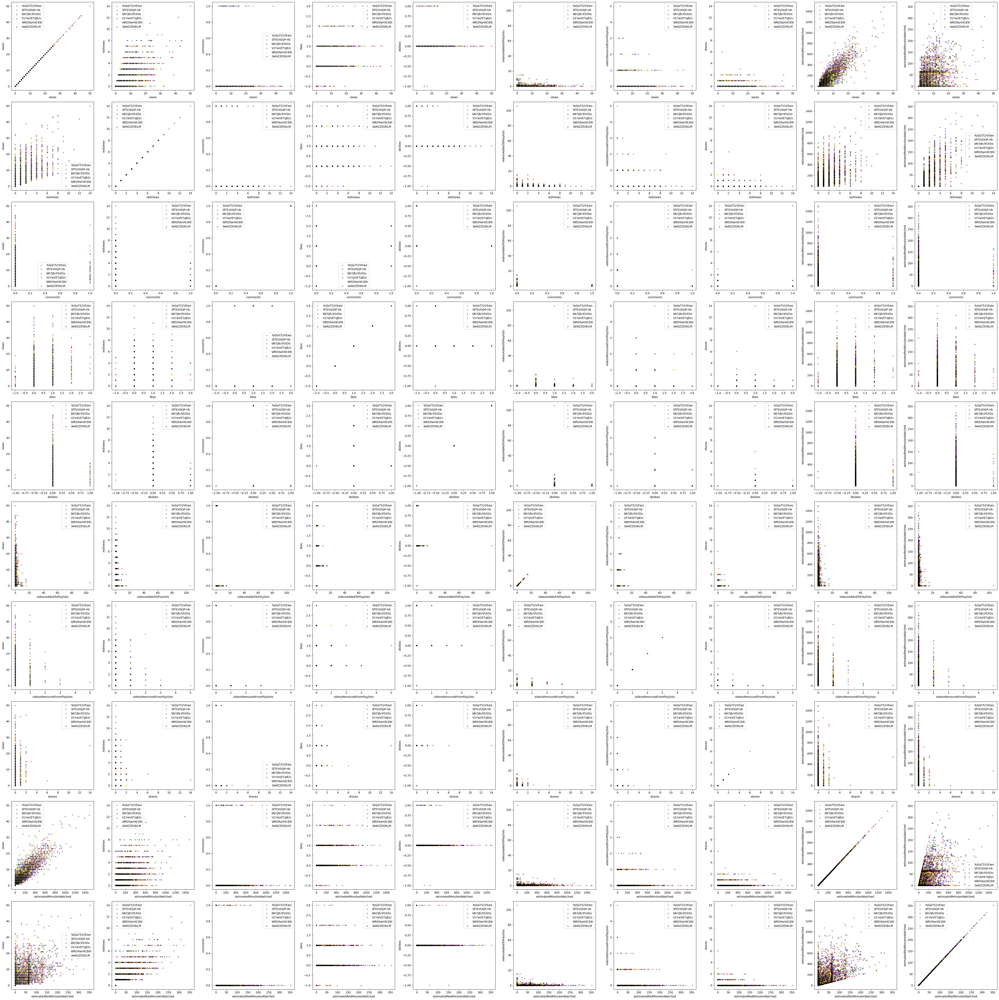

In [ ]:
plt.figure(figsize=(50, 50))
for i, feature_name1 in enumerate(df_kaggle.drop(['day'], axis=1).drop('video_id', axis=1).columns):
    for j, feature_name2 in enumerate(df_kaggle.drop(['day'], axis=1).drop('video_id', axis=1).columns):
        plt.subplot(len(df_kaggle_num.columns), len(df_kaggle_num.columns), len(df_kaggle_num.columns) * i + j + 1)
        plt.xlabel(feature_name1)
        plt.ylabel(feature_name2)
        for label in dict_color:
            plt.scatter(df_kaggle.drop(['day'], axis=1)[df_kaggle.drop(['day'], axis=1)['video_id'] == label][feature_name1],
                        df_kaggle.drop(['day'], axis=1)[df_kaggle.drop(['day'], axis=1)['video_id'] == label][feature_name2],
                        c=dict_color[label], label=label, alpha=0.4, s=10)
        plt.legend()
plt.tight_layout()
plt.show()

# 8.

In [ ]:
def task_8(dataset, a=6):
    dataset_scaler = StandardScaler()
    dataset_scaler.fit(dataset)
    dataset_scaled = dataset_scaler.transform(dataset)

    pca = PCA()
    pca.fit(dataset_scaled)

    # A) Scree plot
    explaned_variance_ratio = pca.explained_variance_ratio_
    plt.figure(figsize=(5, 5))
    plt.title(f'A) scree plot, dataset {name}x{name}')
    plt.plot(np.arange(1, len(explaned_variance_ratio) + 1), explaned_variance_ratio)
    plt.scatter(np.arange(1, len(explaned_variance_ratio) + 1), explaned_variance_ratio, color='red', s=10, alpha=0.6)
    plt.xlabel('Number of components')
    plt.ylabel('Explained variance ratio')
    plt.show()

    # B)
    plt.figure(figsize=(a*3, a*3))
    plt.suptitle(f'B) dataset {name}x{name}')

    if len(explaned_variance_ratio) < a:
           print(f'a > количество переменных  =>  a = кол-во переменных')
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    for i in range(a):
        for j in range(a):
            plt.subplot(a, a, i*a+j+1)
            plt.scatter(pca_result[:, i], pca_result[:, j], color='blue', s=10)
            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.tight_layout()
    plt.show()

    # C)
    plt.figure(figsize=(a*3, a*3))
    plt.suptitle(f'C) dataset {name}x{name}')

    if len(explaned_variance_ratio) < a:
           print(f'a > количество переменных  =>  a = кол-во переменных')
    a = min(len(explaned_variance_ratio), a)
    pca = PCA(n_components=a)
    pca.fit(dataset_scaled)
    pca_result = pca.transform(dataset)
    lim_value = 0
    for i in range(a):
        for j in range(a):
            plt.subplot(a, a, i*a+j+1)
            plt.scatter(pca_result[:, i], pca_result[:, j], color='blue', s=10)
            for k in range(dataset.shape[1]):
                 x, y = pca.components_[i, k], pca.components_[j, k]
                 length = np.linalg.norm([x, y])
                 lim_value = 0
                 plt.quiver(0, 0, x, y, angles='xy', scale_units='xy', scale=1/dataset.shape[1]*0.01, linewidth=0.1, alpha=0.5, color='red')
            plt.xlabel(f'компонента {i+1}')
            plt.ylabel(f'компонента {j+1}')
            lim_value = max(lim_value, np.max(np.abs(pca_result)))
            plt.xlim([-lim_value-1, lim_value+1])
            plt.ylim([-lim_value-1, lim_value+1])
            plt.grid()
            plt.axhline(0, color='gray', linestyle='-', linewidth=0.5)
            plt.axvline(0, color='gray', linestyle='-', linewidth=0.5)
    plt.tight_layout()
    plt.show()

    return pca

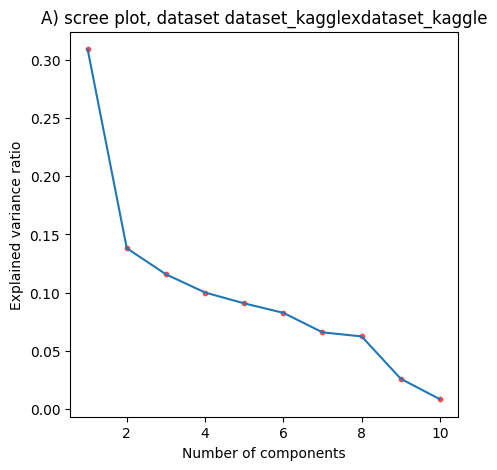

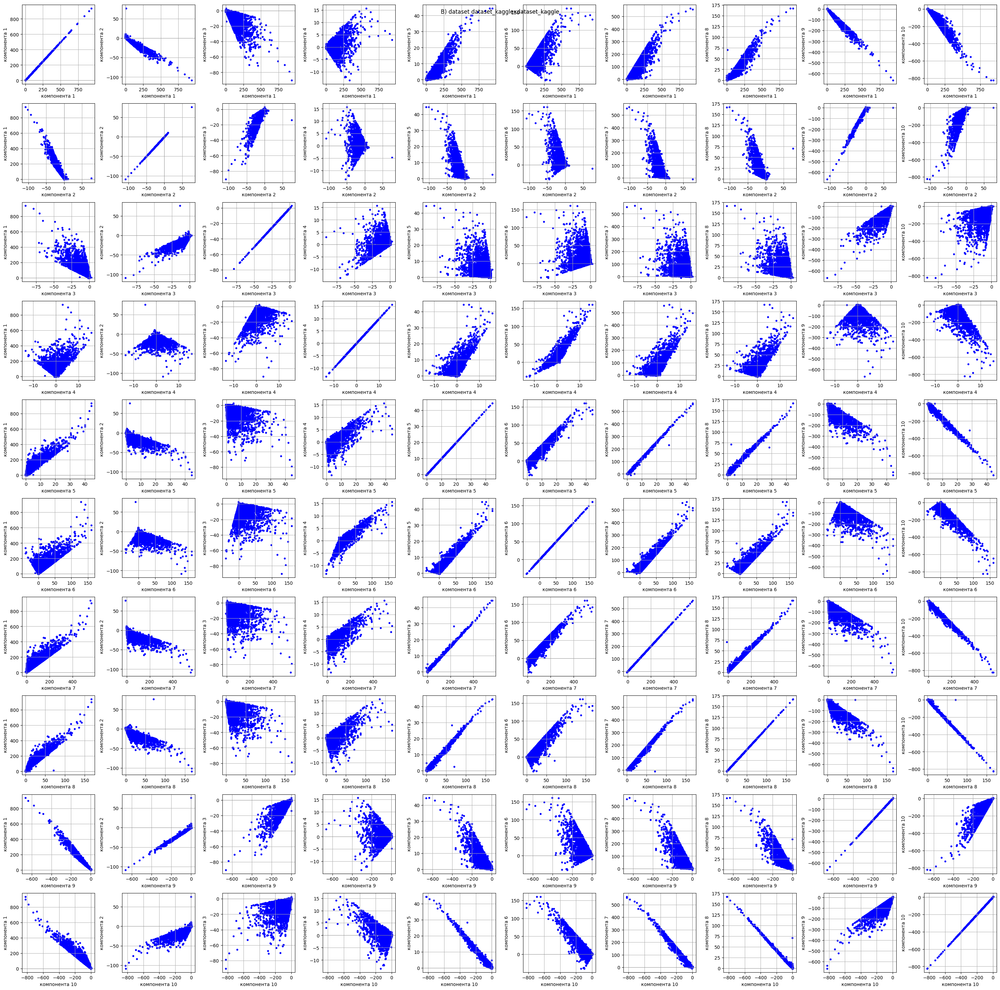

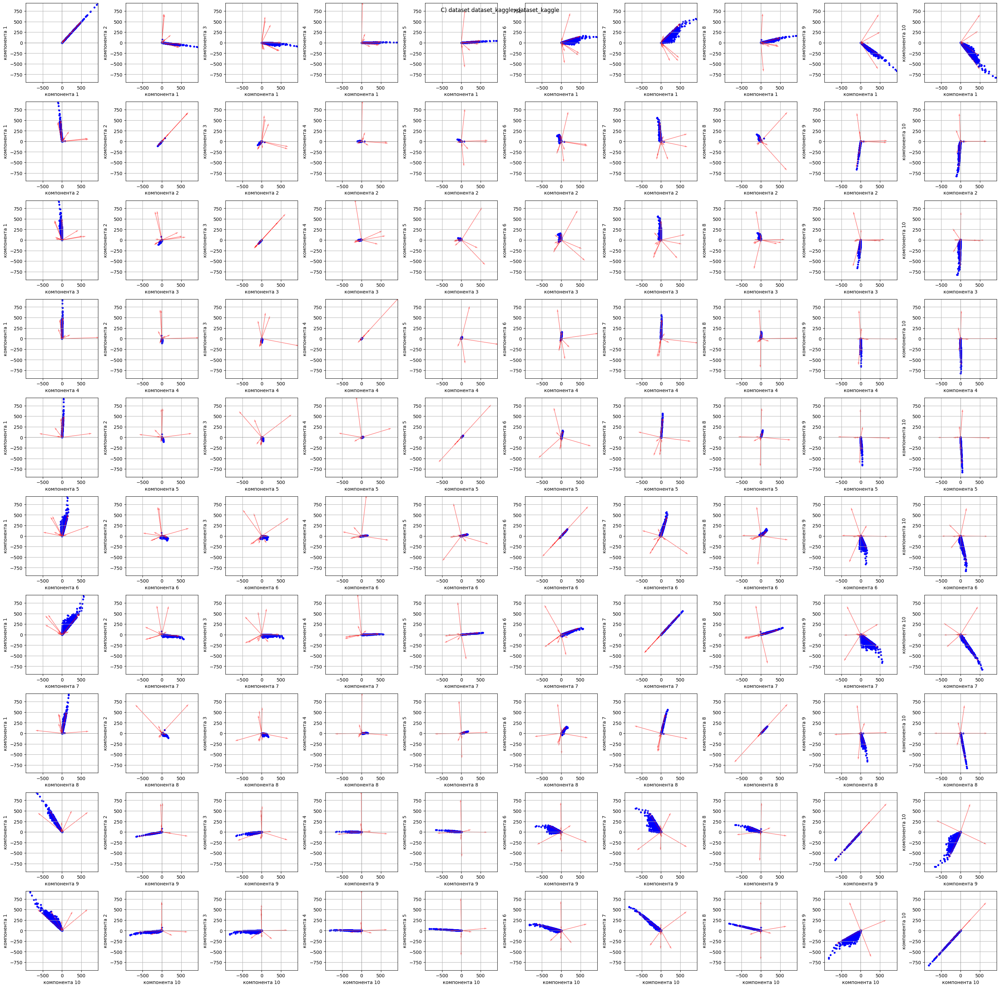

In [ ]:
name = 'dataset_kaggle'
pca = task_8(df_kaggle_num, a=10)

Количество компонентов по методу Кайзера: 4


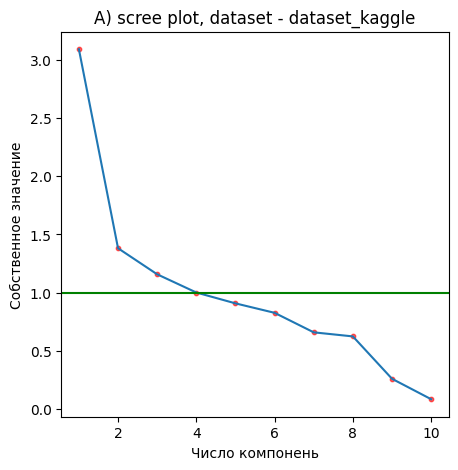

In [ ]:
eigenvalues = pca.explained_variance_
components_kaiser = sum(eigenvalues > 1)

print(f"Количество компонентов по методу Кайзера: {components_kaiser}")
plt.figure(figsize=(5, 5))
plt.title(f'A) scree plot, dataset - {name}')
plt.plot(np.arange(1, len(eigenvalues) + 1), eigenvalues)
plt.scatter(np.arange(1, len(eigenvalues) + 1), eigenvalues, color='red', s=10, alpha=0.6)
plt.axhline(y=1, color='green', linestyle='-', label='Кайзер')
plt.xlabel('Число компонень')
plt.ylabel('Собственное значение')
plt.show()

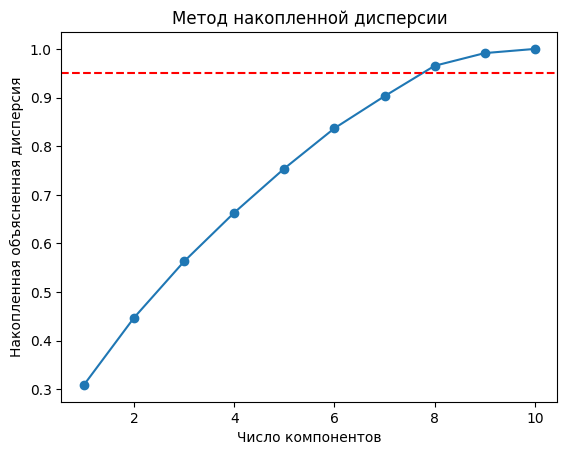

In [ ]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1

plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.axhline(y=0.95, color='r', linestyle='--')
plt.xlabel('Число компонентов')
plt.ylabel('Накопленная объясненная дисперсия')
plt.title('Метод накопленной дисперсии')
plt.show()

# 9.

dataset df_kaggexdf_kagge


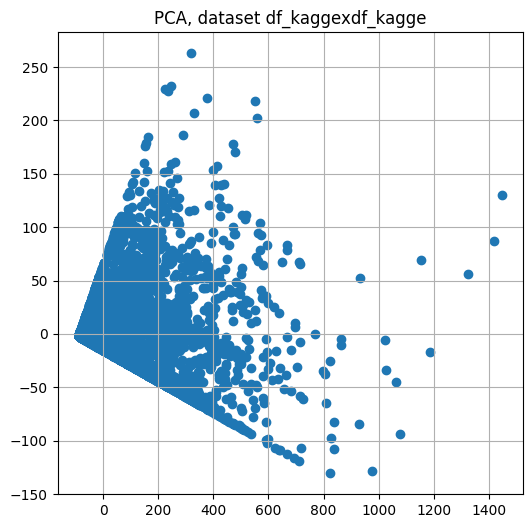

random_state 42


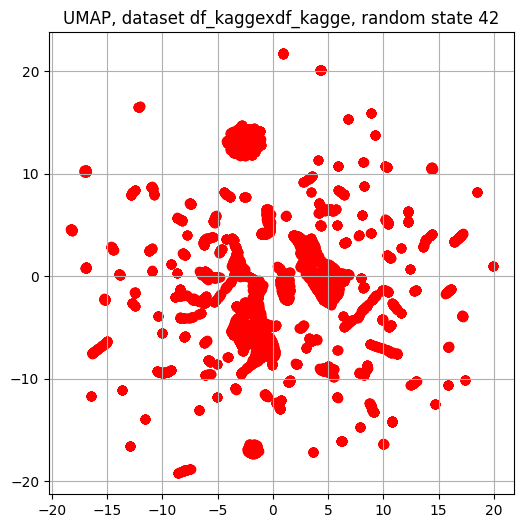

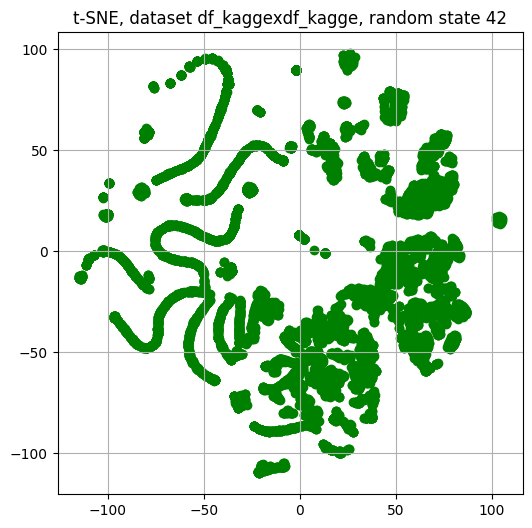

random_state 52


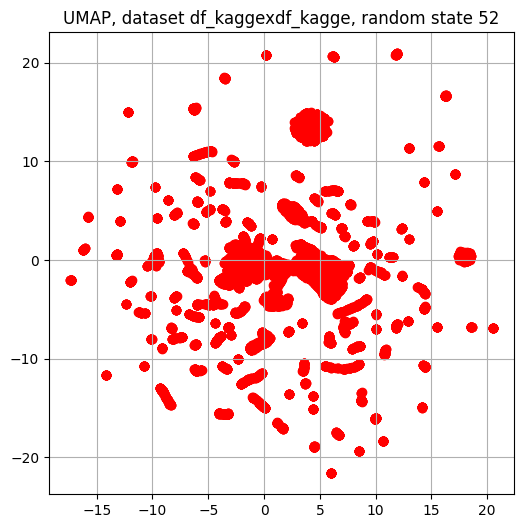

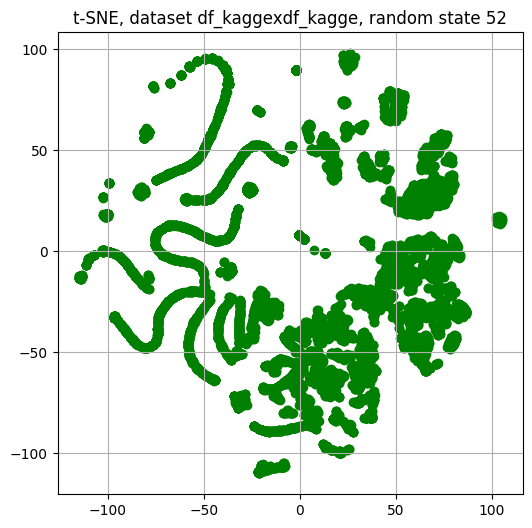

random_state 100


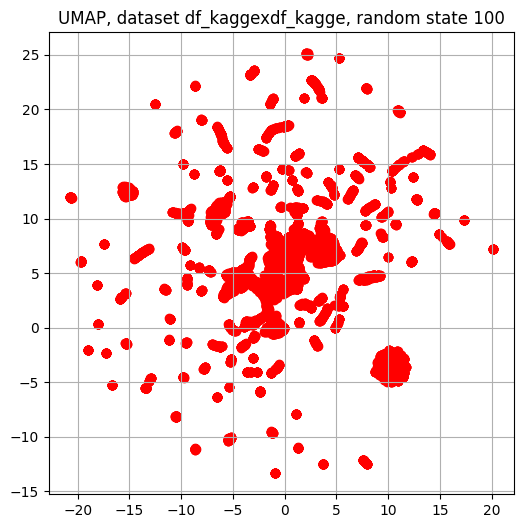

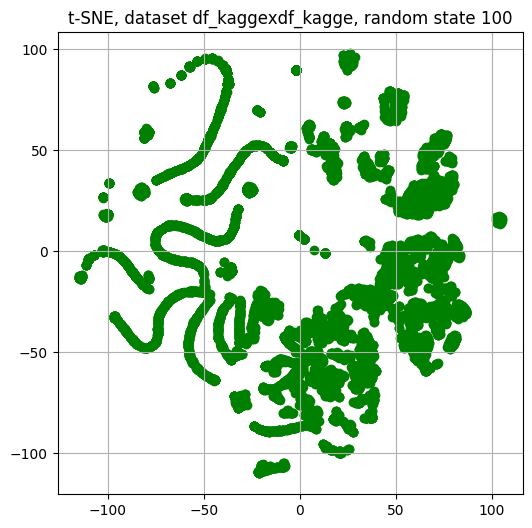

In [ ]:
random_states = [42, 52, 100]
n_components = 2

for name, dataset in [('df_kagge', df_kaggle.drop(['video_id', 'day'], axis=1))]:
    scaler = StandardScaler()
    dataset_scaled = scaler.fit_transform(dataset)

    pca_model = PCA(n_components=n_components)
    data_pca = pca_model.fit_transform(dataset)

    print(f"dataset {name}x{name}")
    plt.figure(figsize=(6, 6))
    plt.scatter(data_pca[:, 0], data_pca[:, 1])
    plt.title(f"PCA, dataset {name}x{name}")
    plt.grid()
    plt.show()

    for random_state in random_states:
        print(f"random_state {random_state}")

        umap_model = umap.UMAP(n_components=n_components, random_state=random_state, n_neighbors=15)
        data_umap = umap_model.fit_transform(dataset_scaled)

        plt.figure(figsize=(6, 6))
        plt.scatter(data_umap[:, 0], data_umap[:, 1], color='red')
        plt.title(f"UMAP, dataset {name}x{name}, random state {random_state}")
        plt.grid()
        plt.show()

        tsne_model = TSNE(n_components=n_components, random_state=random_state)
        perplexity_value = min(30, dataset_scaled.shape[0] // 2)
        tsne_model.perplexity = perplexity_value
        data_tsne = tsne_model.fit_transform(dataset_scaled)

        plt.figure(figsize=(6, 6))
        plt.scatter(data_tsne[:, 0], data_tsne[:, 1], color='green')
        plt.title(f"t-SNE, dataset {name}x{name}, random state {random_state}")
        plt.grid()
        plt.show()